<a href="https://colab.research.google.com/github/christyesmee/Thesis/blob/main/DataProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Pre-processing

## Webpages

* [GDAL ref](https://gdal.org/api/python_bindings.html)

* [EE Run Status](https://code.earthengine.google.com/tasks)

* [EE API Docs](https://developers.google.com/earth-engine/apidocs)

* [EE API Guides](https://developers.google.com/earth-engine/guides)

* [GEE-Python API](https://gee-python-api.readthedocs.io/en/latest/ee.html)

## Installing dependencies

In [ ]:
%%capture
!pip install tqdm gdal
!pip install black[jupyter] --quiet

In [ ]:
import matplotlib.pyplot as plt
import torch
import pandas as pd
import numpy as np
import pickle
import time
import math
import os
import shutil
import torch.nn.functional as F
from torchvision.transforms import CenterCrop
from osgeo import gdal, gdal_array
from IPython.display import Image
from tqdm.notebook import tqdm, trange
from torchvision.transforms.functional import crop
%matplotlib inline

In [ ]:
from google.colab import drive

drive_path = "/content/drive"
drive.mount(drive_path)

Mounted at /content/drive


## Visualize satellite images

In [ ]:
# Set what image you need:
idx = '2_6'
jdx = '4_8'

Combined plot saved to /content/drive/MyDrive/18_change_map_pred/2_6_4_8_sat_img.png


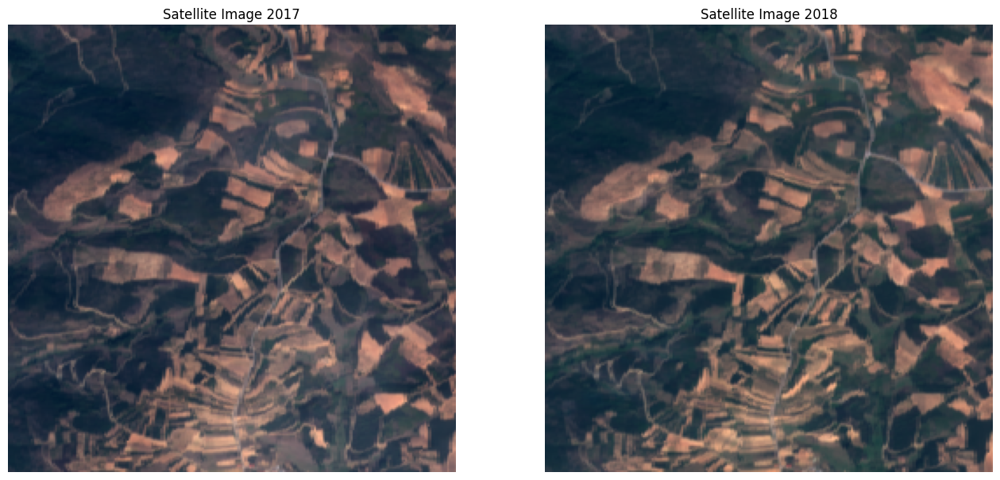

In [ ]:
import torch
import matplotlib.pyplot as plt
import os

def load_and_prepare_image(file_path):
    # Load the tensor
    tensor = torch.load(file_path)

    # Assuming the tensor shape is (C, H, W), where C is the number of channels
    if tensor.ndimension() == 3:
        # Select the first 3 channels for RGB visualization
        rgb_image = tensor[:3, :, :].permute(1, 2, 0)  # Rearrange to (H, W, C) for matplotlib

        # Normalize the image to 0-1 range if necessary
        rgb_image = (rgb_image - rgb_image.min()) / (rgb_image.max() - rgb_image.min())
    else:
        # Handle single channel images
        rgb_image = tensor

    return rgb_image

# File paths
file_path_1 = f"/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"
file_path_2 = f"/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"

# Load and prepare images
image_2017 = load_and_prepare_image(file_path_1)
image_2018 = load_and_prepare_image(file_path_2)

# Plot the original images
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

axs[0].imshow(image_2017)
axs[0].set_title('Satellite Image 2017')
axs[0].axis('off')

axs[1].imshow(image_2018)
axs[1].set_title('Satellite Image 2018')
axs[1].axis('off')

# Save the plot as a PNG file
save_folder = '/content/drive/MyDrive/18_change_map_pred'
os.makedirs(save_folder, exist_ok=True)  # Create the directory if it doesn't exist
save_path = os.path.join(save_folder, f"{idx}_{jdx}_sat_img.png")
plt.savefig(save_path)
print(f"Combined plot saved to {save_path}")

plt.show()


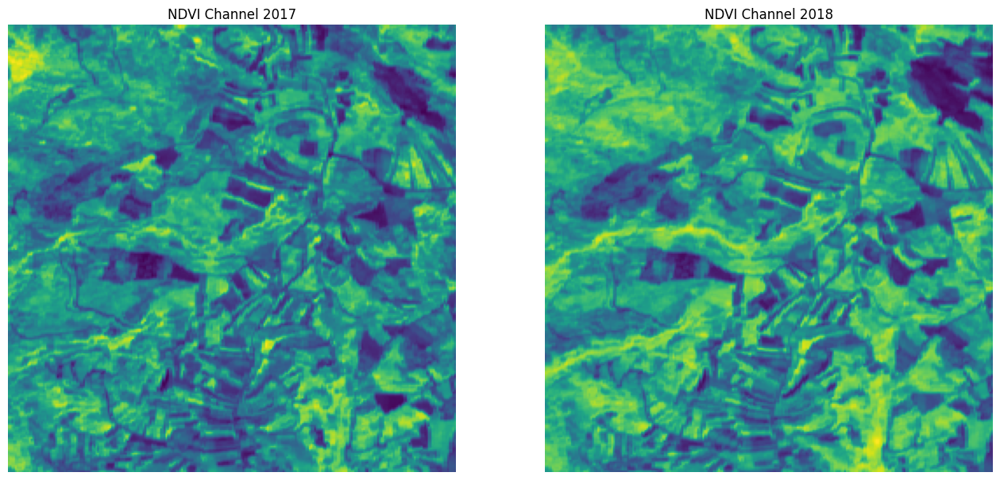

In [ ]:
def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        # Extract the NDVI channel (5th channel, index 4)
        ndvi_channel = tensor[channel, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

# Load and prepare NDVI channels
ndvi_2017 = load_and_prepare_ndvi_channel(file_path_1)
ndvi_2018 = load_and_prepare_ndvi_channel(file_path_2)

# Plot the NDVI channels
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

axs[0].imshow(ndvi_2017, cmap='viridis')
axs[0].set_title('NDVI Channel 2017')
axs[0].axis('off')

axs[1].imshow(ndvi_2018, cmap='viridis')
axs[1].set_title('NDVI Channel 2018')
axs[1].axis('off')

plt.show()


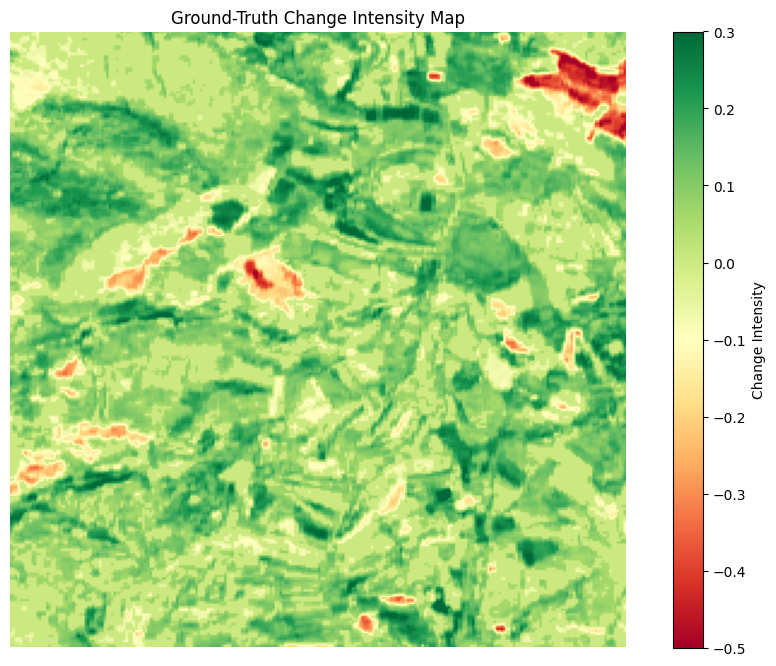

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

# Load and prepare NDVI channels (placeholders for actual loading functions)
ndvi_image_2017 = load_and_prepare_ndvi_channel(file_path_1)  # Single-channel NDVI image for 2017
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_2)  # Single-channel NDVI image for 2018

# Create the change map
threshold = 0.05  # Adjusted threshold for better clarity
change_map, intensity_map = create_change_map(ndvi_image_2017, ndvi_image_2018, threshold=threshold)

# Convert intensity_map to numpy for plotting
intensity_map_np = intensity_map.numpy()

# Plot the intensity map with diverging colormap
plt.figure(figsize=(12, 8))
cax = plt.imshow(intensity_map_np, cmap='RdYlGn', vmin=-0.5, vmax=0.3)
plt.title('Ground-Truth Change Intensity Map')
plt.axis('off')

# Add a color bar to indicate the intensity of changes
cbar = plt.colorbar(cax, orientation='vertical')
cbar.set_label('Change Intensity')

# Save the change intensity map
save_path = f"/content/drive/MyDrive/18_change_map_pred/{idx}_{jdx}_change_intensity_map_true.png"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
plt.savefig(save_path, bbox_inches='tight')

# Show the plot
plt.show()

Combined intensity map plot saved to /content/drive/MyDrive/18_change_map_pred/2_6_4_8_intensity_map_thresholds.png


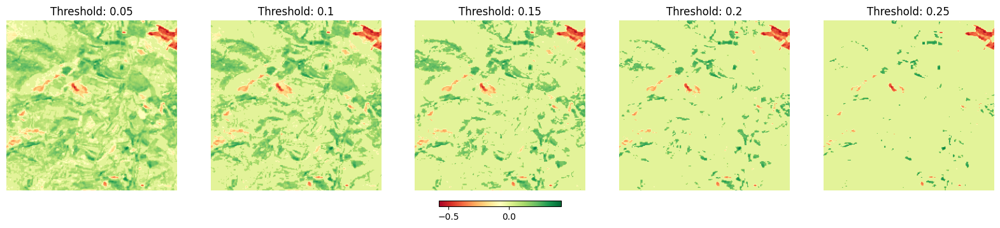

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        # Extract the NDVI channel (5th channel, index 4)
        ndvi_channel = tensor[channel, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

# File paths
file_path_1 = f"/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"
file_path_2 = f"/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"

# Load and prepare NDVI channels
ndvi_image_2017 = load_and_prepare_ndvi_channel(file_path_1)
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_2)

# Experiment with different thresholds
thresholds = [0.05, 0.1, 0.15, 0.2, 0.25]
fig, axs = plt.subplots(1, len(thresholds), figsize=(20, 5))

for i, threshold in enumerate(thresholds):
    _, intensity_map = create_change_map(ndvi_image_2017, ndvi_image_2018, threshold=threshold)
    intensity_map_np = intensity_map.numpy()
    cax = axs[i].imshow(intensity_map_np, cmap='RdYlGn')
    axs[i].set_title(f'Threshold: {threshold}')
    axs[i].axis('off')

# Add a color bar to indicate the intensity of changes
fig.colorbar(cax, ax=axs, orientation='horizontal', fraction=0.025, pad=0.04)

# Save the plot as a PNG file
save_folder = '/content/drive/MyDrive/18_change_map_pred'
os.makedirs(save_folder, exist_ok=True)  # Create the directory if it doesn't exist
save_path = os.path.join(save_folder, f"{idx}_{jdx}_intensity_map_thresholds.png")
plt.savefig(save_path, bbox_inches='tight')
print(f"Combined intensity map plot saved to {save_path}")

# Show the plot
plt.show()


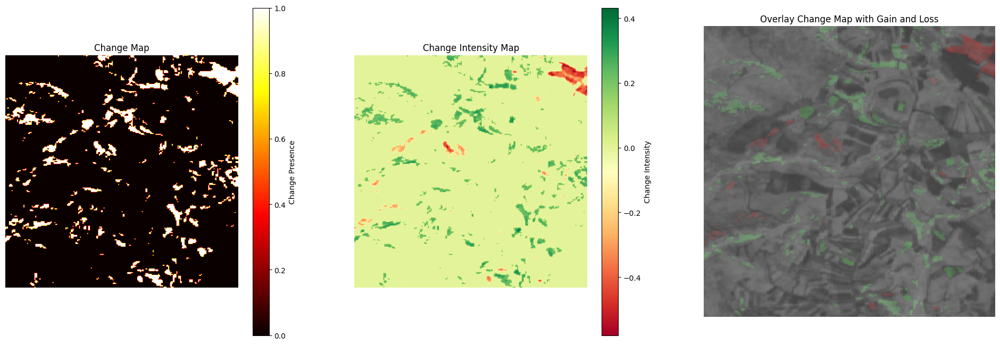

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

# Load and prepare NDVI channels (placeholders for actual loading functions)
ndvi_image_2017 = load_and_prepare_ndvi_channel(file_path_1)  # Single-channel NDVI image for 2017
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_2)  # Single-channel NDVI image for 2018

# Create the change map
threshold = 0.2  # Adjusted threshold for better clarity
change_map, intensity_map = create_change_map(ndvi_image_2017, ndvi_image_2018, threshold=threshold)

# Convert intensity_map to numpy for plotting
intensity_map_np = intensity_map.numpy()

# Plot the change maps
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Plot the change map with colormap
cax1 = axs[0].imshow(change_map, cmap='hot')
axs[0].set_title('Change Map')
axs[0].axis('off')

# Add a color bar to indicate the presence of changes
cbar1 = fig.colorbar(cax1, ax=axs[0], orientation='vertical')
cbar1.set_label('Change Presence')

# Plot the intensity map with diverging colormap
cax2 = axs[1].imshow(intensity_map_np, cmap='RdYlGn')
axs[1].set_title('Change Intensity Map')
axs[1].axis('off')

# Add a color bar to indicate the intensity of changes
cbar2 = fig.colorbar(cax2, ax=axs[1], orientation='vertical')
cbar2.set_label('Change Intensity')

# Overlay change map on the NDVI 2018 image for better context
overlay = np.zeros((*change_map.shape, 3))
overlay[..., 0] = np.where(intensity_map_np < 0, -intensity_map_np, 0)  # Red for loss
overlay[..., 1] = np.where(intensity_map_np > 0, intensity_map_np, 0)   # Green for gain

axs[2].imshow(ndvi_image_2018.numpy(), cmap='gray', alpha=0.5)
axs[2].imshow(overlay, alpha=0.5)
axs[2].set_title('Overlay Change Map with Gain and Loss')
axs[2].axis('off')

plt.show()


In [ ]:
import torch
import numpy as np

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

# Load and prepare NDVI channels (placeholders for actual loading functions)
ndvi_image_2017 = load_and_prepare_ndvi_channel(file_path_1)  # Single-channel NDVI image for 2017
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_2)  # Single-channel NDVI image for 2018

# Create the change map
threshold = 0.05  # Adjusted threshold for better clarity
change_map, intensity_map = create_change_map(ndvi_image_2017, ndvi_image_2018, threshold=threshold)

# Calculate the average NDVI change
average_ndvi_change = intensity_map.sum() / change_map.sum()

print(f'Average NDVI Change: {average_ndvi_change.item()}')


Average NDVI Change: 0.08756741136312485


In [ ]:
import torch
import numpy as np

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        # Extract the NDVI channel (5th channel, index 4)
        ndvi_channel = tensor[channel, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

# File paths
file_path_1 = f"/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"
file_path_2 = f"/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"

# Load and prepare NDVI channels
ndvi_image_2017 = load_and_prepare_ndvi_channel(file_path_1)  # Single-channel NDVI image for 2017
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_2)  # Single-channel NDVI image for 2018

# Create the change map
threshold = 0.05  # Adjusted threshold for better clarity
change_map, intensity_map = create_change_map(ndvi_image_2017, ndvi_image_2018, threshold=threshold)

# Calculate total gains and losses
total_gains = intensity_map[intensity_map > 0].sum().item()
total_losses = intensity_map[intensity_map < 0].sum().item()

# Calculate the number of gain and loss pixels
num_gain_pixels = (intensity_map > 0).sum().item()
num_loss_pixels = (intensity_map < 0).sum().item()

# Calculate average gain and loss values
average_gain = total_gains / num_gain_pixels if num_gain_pixels > 0 else 0
average_loss = total_losses / num_loss_pixels if num_loss_pixels > 0 else 0

# Calculate net average change
net_average_change = (total_gains + total_losses) / change_map.sum().item()

print(f'Average NDVI Change: {net_average_change}')
print(f'Total NDVI Gain: {total_gains}')
print(f'Total NDVI Loss: {total_losses}')
print(f'Average NDVI Gain: {average_gain}')
print(f'Average NDVI Loss: {average_loss}')


Average NDVI Change: 0.08756741309350775
Total NDVI Gain: 4882.78759765625
Total NDVI Loss: -929.118896484375
Average NDVI Gain: 0.12566367093000438
Average NDVI Loss: -0.1476197801849976


Loaded tensor shape from /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_2_6_patch_4_8.pt: torch.Size([5, 256, 256])
Loaded tensor shape from /content/drive/MyDrive/18_predictions/model_prediction_2_6_patch_4_8.pt: torch.Size([1, 256, 256])
Tensor does not have 5 channels. Using the first channel instead.
NDVI health visualization plot saved to /content/drive/MyDrive/18_change_map_pred/2_6_4_8_ndvi.png


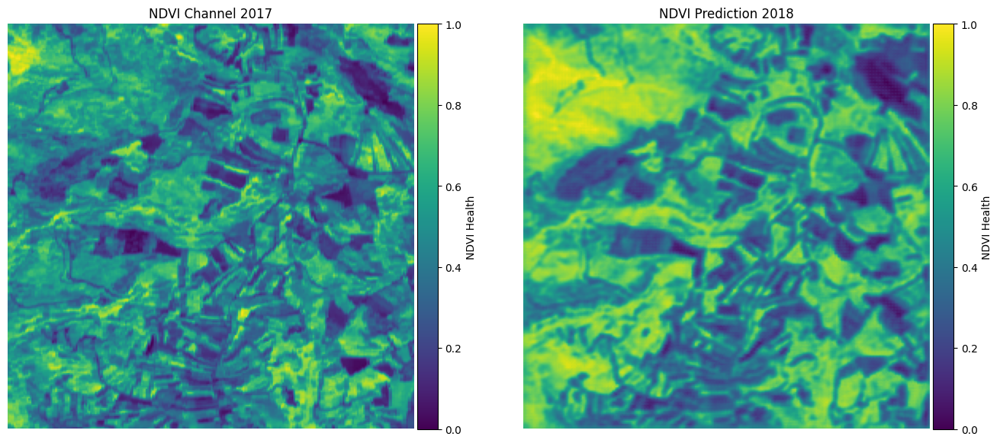

In [ ]:
import torch
import matplotlib.pyplot as plt
import os
from mpl_toolkits.axes_grid1 import make_axes_locatable

def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Print tensor shape for debugging
    print(f"Loaded tensor shape from {file_path}: {tensor.shape}")

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        if tensor.size(0) > channel:
            # Extract the NDVI channel (specified channel index)
            ndvi_channel = tensor[channel, :, :]
        else:
            # Use the first channel if the expected channel is not available
            print(f"Tensor does not have {channel+1} channels. Using the first channel instead.")
            ndvi_channel = tensor[0, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    if ndvi_channel.max() != ndvi_channel.min():
        ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

file_path_1 = f"/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"
file_path_2 = f"/content/drive/MyDrive/18_predictions/model_prediction_{idx}_patch_{jdx}.pt"

# Load and prepare NDVI channels
try:
    ndvi_2017 = load_and_prepare_ndvi_channel(file_path_1)
    ndvi_2018 = load_and_prepare_ndvi_channel(file_path_2)

    # Plot the NDVI channels
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))

    # Plot NDVI 2017 with color bar
    im1 = axs[0].imshow(ndvi_2017, cmap='viridis', vmin=0, vmax=1)
    axs[0].set_title('NDVI Channel 2017')
    axs[0].axis('off')
    divider1 = make_axes_locatable(axs[0])
    cax1 = divider1.append_axes("right", size="5%", pad=0.05)
    cbar1 = fig.colorbar(im1, cax=cax1)
    cbar1.set_label('NDVI Health')

    # Plot NDVI 2018 with color bar
    im2 = axs[1].imshow(ndvi_2018, cmap='viridis', vmin=0, vmax=1)
    axs[1].set_title('NDVI Prediction 2018')
    axs[1].axis('off')
    divider2 = make_axes_locatable(axs[1])
    cax2 = divider2.append_axes("right", size="5%", pad=0.05)
    cbar2 = fig.colorbar(im2, cax=cax2)
    cbar2.set_label('NDVI Health')

    # Save the plot as a PNG file
    save_folder = '/content/drive/MyDrive/18_change_map_pred'
    os.makedirs(save_folder, exist_ok=True)  # Create the directory if it doesn't exist
    save_path = os.path.join(save_folder, f"{idx}_{jdx}_ndvi.png")
    plt.savefig(save_path)
    print(f"NDVI health visualization plot saved to {save_path}")

    plt.show()
except Exception as e:
    print(f"An error occurred: {e}")


In [ ]:
import torch
import numpy as np

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

# Load and prepare NDVI channels (placeholders for actual loading functions)
ndvi_image_2017 = load_and_prepare_ndvi_channel(file_path_1)  # Single-channel NDVI image for 2017
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_2)  # Single-channel NDVI image for 2018

# Create the change map
threshold = 0.05  # Adjusted threshold for better clarity
change_map, intensity_map = create_change_map(ndvi_image_2017, ndvi_image_2018, threshold=threshold)

# Calculate the average NDVI change
average_ndvi_change = intensity_map.sum() / change_map.sum()

print(f'Average NDVI Change: {average_ndvi_change.item()}')


Loaded tensor shape from /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_2_6_patch_4_8.pt: torch.Size([5, 256, 256])
Loaded tensor shape from /content/drive/MyDrive/18_predictions/model_prediction_2_6_patch_4_8.pt: torch.Size([1, 256, 256])
Tensor does not have 5 channels. Using the first channel instead.
Average NDVI Change: 0.11527746170759201


In [ ]:
import torch
import numpy as np

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        # Extract the NDVI channel (5th channel, index 4)
        ndvi_channel = tensor[channel, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

# File paths
file_path_1 = f"/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"
file_path_2 = f"/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"

# Load and prepare NDVI channels
ndvi_image_2017 = load_and_prepare_ndvi_channel(file_path_1)  # Single-channel NDVI image for 2017
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_2)  # Single-channel NDVI image for 2018

# Create the change map
threshold = 0.05  # Adjusted threshold for better clarity
change_map, intensity_map = create_change_map(ndvi_image_2017, ndvi_image_2018, threshold=threshold)

# Calculate total gains and losses
total_gains = intensity_map[intensity_map > 0].sum().item()
total_losses = intensity_map[intensity_map < 0].sum().item()

# Calculate the number of gain and loss pixels
num_gain_pixels = (intensity_map > 0).sum().item()
num_loss_pixels = (intensity_map < 0).sum().item()

# Calculate average gain and loss values
average_gain = total_gains / num_gain_pixels if num_gain_pixels > 0 else 0
average_loss = total_losses / num_loss_pixels if num_loss_pixels > 0 else 0

# Calculate net average change
net_average_change = (total_gains + total_losses) / change_map.sum().item()

print(f'Average NDVI Change: {net_average_change}')
print(f'Total NDVI Gain: {total_gains}')
print(f'Total NDVI Loss: {total_losses}')
print(f'Average NDVI Gain: {average_gain}')
print(f'Average NDVI Loss: {average_loss}')


Average NDVI Change: 0.08756741309350775
Total NDVI Gain: 4882.78759765625
Total NDVI Loss: -929.118896484375
Average NDVI Gain: 0.12566367093000438
Average NDVI Loss: -0.1476197801849976


Tensor shape for /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_2_6_patch_4_8.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_predictions/model_prediction_2_6_patch_4_8.pt: torch.Size([1, 256, 256])


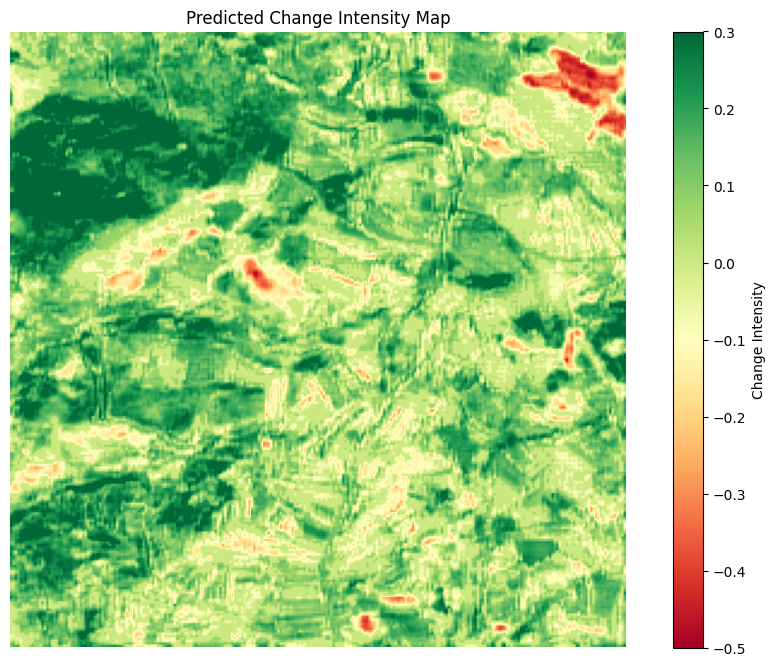

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        if tensor.size(0) > channel:
            # Extract the NDVI channel (5th channel, index 4)
            ndvi_channel = tensor[channel, :, :]
        else:
            # Use the first channel if the requested channel is not available
            ndvi_channel = tensor[0, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

def load_single_channel_ndvi(file_path):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Handle the case where it is a 3D tensor with a single channel
    if tensor.ndimension() == 3 and tensor.size(0) == 1:
        tensor = tensor.squeeze(0)
    elif tensor.ndimension() != 2:
        raise ValueError("Expected a single-channel 2D tensor or a 3D tensor with a singleton dimension")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (tensor - tensor.min()) / (tensor.max() - tensor.min())

    return ndvi_channel

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

# File paths
file_path_1 = f"/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"
file_path_2 = f"/content/drive/MyDrive/18_predictions/model_prediction_{idx}_patch_{jdx}.pt"

# Load and prepare NDVI channels
ndvi_2017 = load_and_prepare_ndvi_channel(file_path_1)
ndvi_2018 = load_single_channel_ndvi(file_path_2)

# Create the change map
threshold = 0.05  # Adjusted threshold for better clarity
change_map, intensity_map = create_change_map(ndvi_2017, ndvi_2018, threshold=threshold)

# Convert intensity_map to numpy for plotting
intensity_map_np = intensity_map.numpy()

# Plot the intensity map with diverging colormap
plt.figure(figsize=(12, 8))
cax = plt.imshow(intensity_map_np, cmap='RdYlGn', vmin=-0.5, vmax=0.3)
plt.title('Predicted Change Intensity Map')
plt.axis('off')

# Add a color bar to indicate the intensity of changes
cbar = plt.colorbar(cax, orientation='vertical')
cbar.set_label('Change Intensity')

# Save the change intensity map
save_path = f"/content/drive/MyDrive/18_change_map_pred/{idx}_{jdx}_change_intensity_map_pred.png"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
plt.savefig(save_path, bbox_inches='tight')

# Show the plot
plt.show()


In [ ]:
import torch
import numpy as np

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the difference
    difference = ndvi2 - ndvi1

    # Create a binary mask where differences are above the threshold
    change_map = torch.abs(difference) > threshold

    # Mask the differences to get intensities only where changes are detected
    intensity_map = difference * change_map

    return change_map.float(), intensity_map

def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        if tensor.size(0) > channel:
            # Extract the NDVI channel (5th channel, index 4)
            ndvi_channel = tensor[channel, :, :]
        else:
            # Use the first channel if the requested channel is not available
            ndvi_channel = tensor[0, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    elif tensor.ndimension() == 3 and tensor.size(0) == 1:
        # Handle the case where it is a 3D tensor with a single channel
        ndvi_channel = tensor.squeeze(0)
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

file_path_1 = f"/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_{idx}_patch_{jdx}.pt"
file_path_2 = f"/content/drive/MyDrive/18_predictions/model_prediction_{idx}_patch_{jdx}.pt"

# Load and prepare NDVI channels
ndvi_image_2017 = load_and_prepare_ndvi_channel(file_path_1)  # Multi-channel NDVI image for 2017
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_2, channel=0)  # Single-channel NDVI image for 2018

# Create the change map
threshold = 0.05  # Adjusted threshold for better clarity
change_map, intensity_map = create_change_map(ndvi_image_2017, ndvi_image_2018, threshold=threshold)

# Calculate total gains and losses
total_gains = intensity_map[intensity_map > 0].sum().item()
total_losses = intensity_map[intensity_map < 0].sum().item()

# Calculate the number of gain and loss pixels
num_gain_pixels = (intensity_map > 0).sum().item()
num_loss_pixels = (intensity_map < 0).sum().item()

# Calculate average gain and loss values
average_gain = total_gains / num_gain_pixels if num_gain_pixels > 0 else 0
average_loss = total_losses / num_loss_pixels if num_loss_pixels > 0 else 0

# Calculate net average change
net_average_change = (total_gains + total_losses) / change_map.sum().item()

print(f'Average NDVI Change: {net_average_change}')
print(f'Total NDVI Gain: {total_gains}')
print(f'Total NDVI Loss: {total_losses}')
print(f'Average NDVI Gain: {average_gain}')
print(f'Average NDVI Loss: {average_loss}')


Tensor shape for /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_2_6_patch_4_8.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_predictions/model_prediction_2_6_patch_4_8.pt: torch.Size([1, 256, 256])
Average NDVI Change: 0.11527746701308607
Total NDVI Gain: 6887.3857421875
Total NDVI Loss: -1153.715087890625
Average NDVI Gain: 0.16912766108065466
Average NDVI Loss: -0.1279772698713949


# Continue

Tensor shape for /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/17_ont_pt_256_rad50/galicia_split_image_0_0_ext_patch_0_1.pt: torch.Size([8, 256, 256])


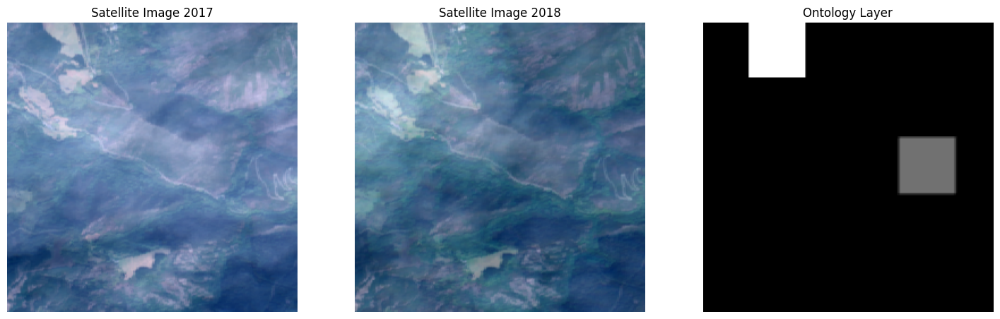

In [ ]:
import torch
import matplotlib.pyplot as plt

def load_and_prepare_image(file_path):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Assuming the tensor shape is (C, H, W), where C is the number of channels
    # Select the first 3 channels for RGB visualization (or any other combination)
    rgb_image = tensor[:3, :, :].permute(1, 2, 0)  # Rearrange to (H, W, C) for matplotlib

    # Normalize the image to 0-1 range if necessary
    rgb_image = (rgb_image - rgb_image.min()) / (rgb_image.max() - rgb_image.min())

    return rgb_image

def load_and_prepare_NDVI_image(file_path):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Select the 8th channel (index 7) for NDVI visualization
    ndvi_image = tensor[7, :, :]  # Extract the 8th channel

    # Normalize the image to 0-1 range if necessary
    if ndvi_image.max() != ndvi_image.min():
        ndvi_image = (ndvi_image - ndvi_image.min()) / (ndvi_image.max() - ndvi_image.min())
    else:
        ndvi_image = torch.zeros_like(ndvi_image)  # Set to zero if no range to avoid division by zero

    return ndvi_image

# File paths
file_path_1 = '/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt'
file_path_2 = '/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt'
file_path_3 = '/content/drive/MyDrive/17_ont_pt_256_rad50/galicia_split_image_0_0_ext_patch_0_1.pt'
#file_path_3 = '/content/drive/MyDrive/17_ont_pt_processed_rad50/galicia_split_image_0_0_ext.pt'


# Load and prepare images
image_1 = load_and_prepare_image(file_path_1)
image_2 = load_and_prepare_image(file_path_2)
image_3 = load_and_prepare_NDVI_image(file_path_3)

# Plot the images side by side
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjusted figsize for three images

axs[0].imshow(image_1)
axs[0].set_title('Satellite Image 2017')
axs[0].axis('off')

axs[1].imshow(image_2)
axs[1].set_title('Satellite Image 2018')
axs[1].axis('off')

axs[2].imshow(image_3, cmap='gray')  # Added cmap='gray' for NDVI
axs[2].set_title('Ontology Layer')
axs[2].axis('off')

plt.show()


In [ ]:
import torch

# Load the tensor from the .pt file
tensor = torch.load('/content/drive/MyDrive/18_sat_ndvi_labels_256/ndvi18_0_0_patch_0_0.pt')

# Get the shape of the tensor
tensor_shape = tensor.shape

# Print the shape of the tensor
print(f'The shape of the tensor is: {tensor_shape}')


The shape of the tensor is: torch.Size([256, 256])


Tensor shape for /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_sat_ndvi_labels_256/ndvi18_0_0_patch_0_0.pt: torch.Size([256, 256])


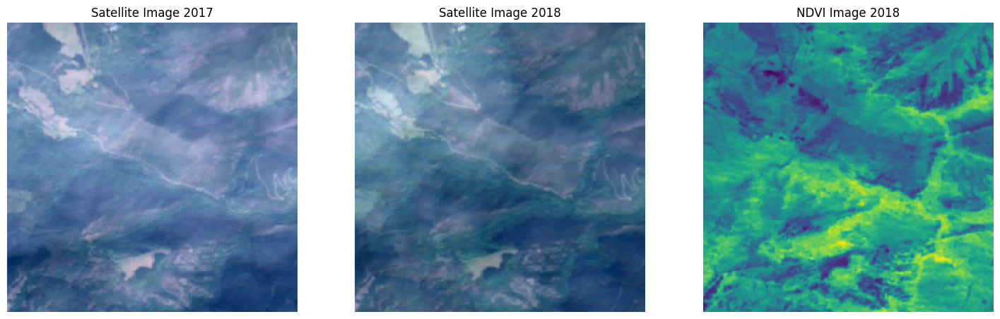

In [ ]:
import torch
import matplotlib.pyplot as plt

def load_and_prepare_image(file_path):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Assuming the tensor shape is (C, H, W), where C is the number of channels
    if tensor.ndimension() == 3:
        # Select the first 3 channels for RGB visualization (or any other combination)
        rgb_image = tensor[:3, :, :].permute(1, 2, 0)  # Rearrange to (H, W, C) for matplotlib

        # Normalize the image to 0-1 range if necessary
        rgb_image = (rgb_image - rgb_image.min()) / (rgb_image.max() - rgb_image.min())
    else:
        # Handle single channel images
        rgb_image = tensor

    return rgb_image

def load_and_prepare_NDVI_image(file_path):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Assuming tensor is a single-channel image
    ndvi_image = tensor

    # Normalize the image to 0-1 range if necessary
    ndvi_image = (ndvi_image - ndvi_image.min()) / (ndvi_image.max() - ndvi_image.min())

    return ndvi_image

# File paths
file_path_1 = '/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt'
file_path_2 = '/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt'
file_path_3 = '/content/drive/MyDrive/18_sat_ndvi_labels_256/ndvi18_0_0_patch_0_0.pt'

# Load and prepare images
image_1 = load_and_prepare_image(file_path_1)
image_2 = load_and_prepare_image(file_path_2)
image_3 = load_and_prepare_NDVI_image(file_path_3)

# Plot the images side by side
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjusted figsize for three images

axs[0].imshow(image_1)
axs[0].set_title('Satellite Image 2017')
axs[0].axis('off')

axs[1].imshow(image_2)
axs[1].set_title('Satellite Image 2018')
axs[1].axis('off')

axs[2].imshow(image_3, cmap='viridis')  # Use 'viridis' for NDVI
axs[2].set_title('NDVI Image 2018')
axs[2].axis('off')

plt.show()


Tensor shape for /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt: torch.Size([5, 256, 256])


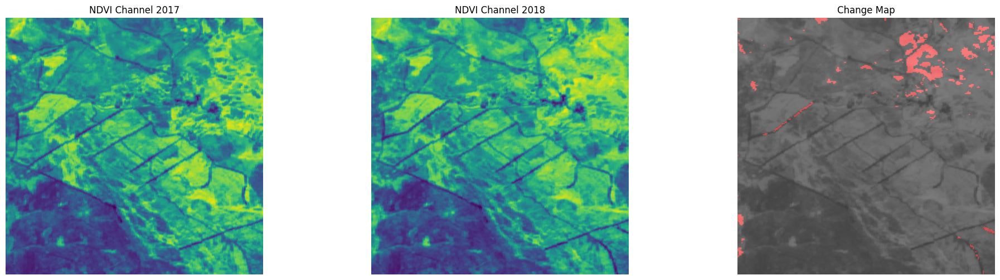

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        # Extract the NDVI channel (5th channel, index 4)
        ndvi_channel = tensor[channel, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the absolute difference
    difference = torch.abs(ndvi1 - ndvi2)

    # Create a binary mask where differences are above a threshold
    change_map = difference > threshold

    return change_map.float()

# File paths
file_path_1 = '/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt'
file_path_2 = '/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt'

# Load and prepare NDVI channels
ndvi_2017 = load_and_prepare_ndvi_channel(file_path_1)
ndvi_2018 = load_and_prepare_ndvi_channel(file_path_2)

# Create the change map
threshold = 0.2  # Adjusted threshold for better clarity
change_map = create_change_map(ndvi_2017, ndvi_2018, threshold=threshold)

# Plot the images and the change map side by side
fig, axs = plt.subplots(1, 3, figsize=(24, 6))  # Adjusted figsize for three images

axs[0].imshow(ndvi_2017, cmap='viridis')
axs[0].set_title('NDVI Channel 2017')
axs[0].axis('off')

axs[1].imshow(ndvi_2018, cmap='viridis')
axs[1].set_title('NDVI Channel 2018')
axs[1].axis('off')

# Overlay change map on the NDVI 2018 image for better context
overlay = np.zeros((*change_map.shape, 3))
overlay[..., 0] = change_map  # Red channel for change

axs[2].imshow(ndvi_2018, cmap='gray', alpha=0.5)
axs[2].imshow(overlay, alpha=0.5)
axs[2].set_title('Change Map')
axs[2].axis('off')

plt.show()


Tensor shape for /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_sat_ndvi_labels_256/ndvi18_0_0_patch_0_0.pt: torch.Size([256, 256])


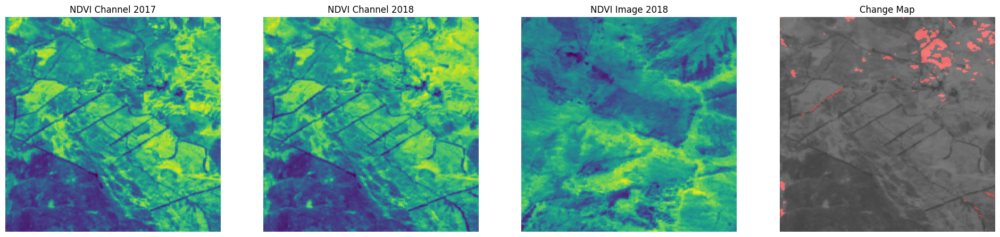

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def load_and_prepare_ndvi_channel(file_path, channel=4):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Handle different tensor shapes
    if tensor.ndimension() == 3:
        # Extract the NDVI channel (5th channel, index 4)
        ndvi_channel = tensor[channel, :, :]
    elif tensor.ndimension() == 2:
        # If the tensor is already 2D, use it directly
        ndvi_channel = tensor
    else:
        raise ValueError("Unexpected tensor shape")

    # Normalize the image to 0-1 range if necessary
    ndvi_channel = (ndvi_channel - ndvi_channel.min()) / (ndvi_channel.max() - ndvi_channel.min())

    return ndvi_channel

def create_change_map(ndvi1, ndvi2, threshold=0.1):
    # Ensure the NDVI images are the same size
    assert ndvi1.shape == ndvi2.shape, "Images must have the same dimensions for comparison"

    # Calculate the absolute difference
    difference = torch.abs(ndvi1 - ndvi2)

    # Create a binary mask where differences are above a threshold
    change_map = difference > threshold

    return change_map.float()

# File paths
file_path_1 = '/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt'
file_path_2 = '/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt'
file_path_3 = '/content/drive/MyDrive/18_sat_ndvi_labels_256/ndvi18_0_0_patch_0_0.pt'

# Load and prepare NDVI channels
ndvi_2017 = load_and_prepare_ndvi_channel(file_path_1)
ndvi_2018 = load_and_prepare_ndvi_channel(file_path_2)
ndvi_image_2018 = load_and_prepare_ndvi_channel(file_path_3)  # Single-channel NDVI image

# Create the change map
threshold = 0.2  # Adjusted threshold for better clarity
change_map = create_change_map(ndvi_2017, ndvi_2018, threshold=threshold)

# Plot the images and the change map side by side
fig, axs = plt.subplots(1, 4, figsize=(24, 6))  # Adjusted figsize for four images

axs[0].imshow(ndvi_2017, cmap='viridis')
axs[0].set_title('NDVI Channel 2017')
axs[0].axis('off')

axs[1].imshow(ndvi_2018, cmap='viridis')
axs[1].set_title('NDVI Channel 2018')
axs[1].axis('off')

axs[2].imshow(ndvi_image_2018, cmap='viridis')  # Use 'viridis' for NDVI
axs[2].set_title('NDVI Image 2018')
axs[2].axis('off')

# Overlay change map on the NDVI 2018 image for better context
overlay = np.zeros((*change_map.shape, 3))
overlay[..., 0] = change_map  # Red channel for change

axs[3].imshow(ndvi_2018, cmap='gray', alpha=0.5)
axs[3].imshow(overlay, alpha=0.5)
axs[3].set_title('Change Map')
axs[3].axis('off')

plt.show()


Tensor shape for /content/drive/MyDrive/17_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt: torch.Size([5, 256, 256])
Tensor shape for /content/drive/MyDrive/18_ont_pt_256_rad50/galicia_split_image_1_6_ext_patch_1_2.pt: torch.Size([8, 256, 256])


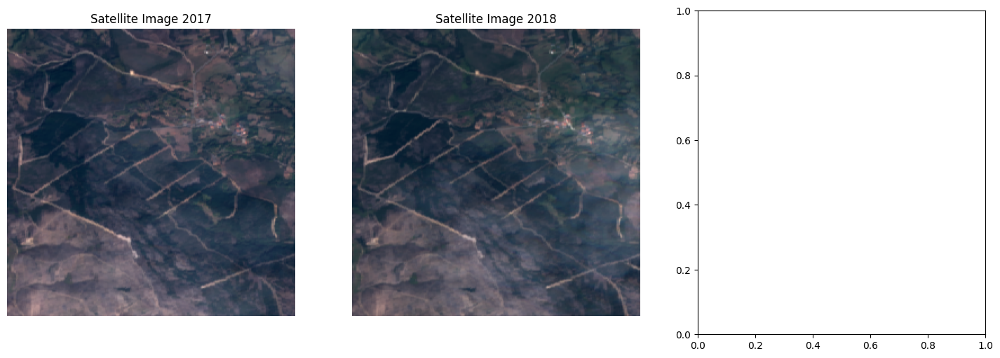

In [ ]:
import torch
import matplotlib.pyplot as plt

def load_and_prepare_image(file_path):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Assuming the tensor shape is (C, H, W), where C is the number of channels
    # Select the first 3 channels for RGB visualization (or any other combination)
    rgb_image = tensor[:3, :, :].permute(1, 2, 0)  # Rearrange to (H, W, C) for matplotlib

    # Normalize the image to 0-1 range if necessary
    rgb_image = (rgb_image - rgb_image.min()) / (rgb_image.max() - rgb_image.min())

    return rgb_image

def load_and_prepare_NDVI_image(file_path):
    # Load the tensor
    tensor = torch.load(file_path)

    # Check the shape of the tensor
    print(f"Tensor shape for {file_path}:", tensor.shape)

    # Select the 8th channel (index 7) for NDVI visualization
    ndvi_image = tensor[7, :, :]  # Extract the 8th channel

    # Normalize the image to 0-1 range if necessary
    ndvi_image = (ndvi_image - ndvi_image.min()) / (ndvi_image.max() - ndvi_image.min())

    return ndvi_image

# File paths
file_path_1 = '/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt'
file_path_2 = '/content/drive/MyDrive/18_sat_pt_256/galicia_split_image_1_6_patch_1_2.pt'
file_path_3 = '/content/drive/MyDrive/18_ont_pt_256_rad50/galicia_split_image_1_6_ext_patch_1_2.pt'


# Load and prepare images
image_1 = load_and_prepare_image(file_path_1)
image_2 = load_and_prepare_image(file_path_2)
image_3 = load_and_prepare_NDVI_image(file_path_3)

# Plot the images side by side
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].imshow(image_1)
axs[0].set_title('Satellite Image 2017')
axs[0].axis('off')

axs[1].imshow(image_2)
axs[1].set_title('Satellite Image 2018')
axs[1].axis('off')

axs[1].imshow(image_3)
axs[1].set_title('Satellite Image 2018')
axs[1].axis('off')

plt.show()


# 1. Pre-processing Sentinel-2A images (2017)

## Defining paths

In [ ]:
# File path setup
img_dir = "17_sat_tif_processed"
folder_path = f"{drive_path}/MyDrive/{img_dir}"

# Image path & scale for Sentinel-2A download
file_name = "galicia_split_image"  # Name of the .tif file
file_path = f"{folder_path}/{file_name}"
scale = 10  # pixels per meter
AS_TYPE = torch.float32
slices = 7

# Feature ontology path
ont_dir = "ont_pickles"
folder_path_ont = f"{drive_path}/MyDrive/{ont_dir}"
file_name_ont = "ont_features"
file_path_ont = f"{folder_path_ont}/{file_name_ont}"

## Getting the correct dimensions

Due to reasons discussed below, there are some NaN values found that need to be removed.

**Explanation of NaN values in .tif**

The issue of NaN values appearing at the top of the images could be caused by several factors when using Google Earth Engine (GEE) to process and download satellite imagery. Here are some of the most common reasons and potential solutions to consider:

* Edge of Satellite Coverage: The area of interest (AOI) may extend slightly beyond the area covered by the satellite's imaging swath, especially for areas near the edge of the satellite's coverage. This can result in NaN values where no data is available.

* Projection and Resampling Issues: When images are projected or resampled to a different resolution or coordinate system, interpolation methods can introduce NaN values if the transformation results in areas without data coverage.

* Cloud and Cloud Shadow Masking: If your preprocessing includes cloud masking, and if clouds cover a significant part of a tile, this can result in NaN values after masking. Since your code uses a cloud filter to limit images to those with less than 20% cloud cover, this might not be the primary issue unless the cloud cover filter is failing or misconfigured.

* Data Availability and Quality: There may be gaps in data availability due to various reasons like satellite maintenance, operational issues, or sensor anomalies during the acquisition period specified (date_0 to date_1).


#### Execute the code below to see the blank NaN pixels in the rows on the top/bottom of the image

100%|██████████| 7/7 [00:22<00:00,  3.28s/it]


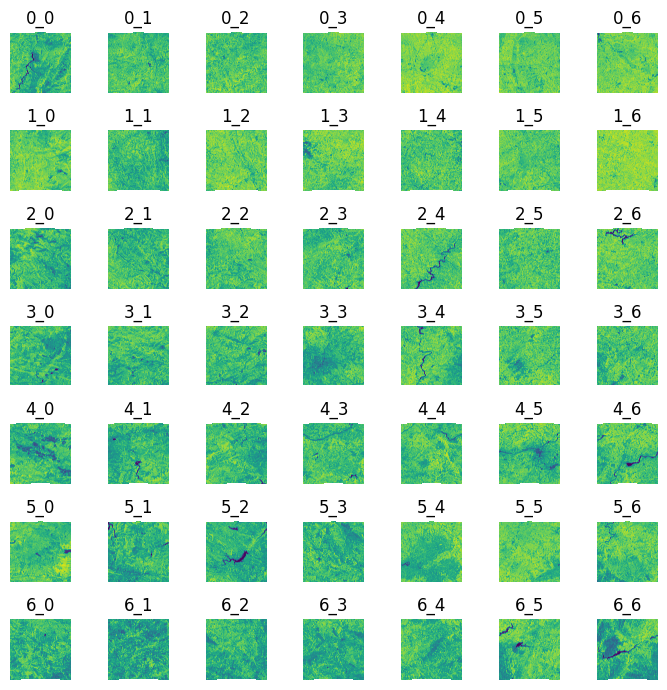

In [ ]:
band = 4  # Change this to the desired band number

def load_and_plot_tif_files(folder_path, num_rows, num_cols, channel=band, save_path=None):
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 1, num_rows * 1))
    for i in range(num_rows):
        for j in trange(num_cols):
            file_name = f"galicia_split_image_{j}_{i}.tif"
            file_path = os.path.join(folder_path, file_name)
            axis_name = f"{i}_{j}"
            try:
                if os.path.exists(file_path):
                    dataset = gdal.Open(file_path)
                    if dataset is not None:
                        data = dataset.ReadAsArray()
                        # Check if data has at least 2 dimensions and enough channels
                        if data.ndim > 2 and data.shape[0] >= channel:
                            # Select one channel to display (0 by default)
                            ax = axs[i, j] if num_rows > 1 and num_cols > 1 else axs[max(i, j)]
                            im = ax.imshow(data[channel, :, :], cmap='viridis')
                            ax.title.set_text(axis_name)
                            ax.axis('off')
                        else:
                            print(f"Data in {file_name} does not meet expected shape or channel count, skipping...")
                    else:
                        print(f"Failed to open {file_name}")
                else:
                    print(f"{file_name} not found.")
            except Exception as e:
                print(f"Failed to load {file_name}: {e}")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)  # Save the figure to a file
    plt.show()

folder_path = "/content/drive/MyDrive/17_sat_tif"  # Replace with the path to your .tif files
num_rows = 7    # Set the number of rows of the grid
num_cols = 7    # Set the number of columns of the grid
save_path = '/content/drive/MyDrive/visualisation.png'  # Specify the path to save the image
load_and_plot_tif_files(folder_path, num_rows, num_cols, channel=band, save_path=save_path)


### Removing the NaN values ans save new .tif

In [ ]:
def remove_nan_rows(data):
    """Remove rows that contain NaN values from any band."""
    # Create a mask for rows without NaNs across all bands
    mask = ~np.isnan(data).any(axis=(0, 2))
    return data[:, mask, :]

def save_as_tif(data, file_path, original_dataset):
    """Save the NumPy array as a .tif file using the original dataset's metadata."""
    driver = gdal.GetDriverByName("GTiff")
    out_dataset = driver.Create(file_path, data.shape[2], data.shape[1], data.shape[0], gdal_array.NumericTypeCodeToGDALTypeCode(data.dtype))

    # Copy geo-transform and projection from the original dataset
    out_dataset.SetGeoTransform(original_dataset.GetGeoTransform())
    out_dataset.SetProjection(original_dataset.GetProjection())

    for i in range(data.shape[0]):
        out_dataset.GetRasterBand(i + 1).WriteArray(data[i])

    out_dataset.FlushCache()
    out_dataset = None

def process_and_save_tif_files(input_folder_path, output_folder_path, num_rows, num_cols):
    if not os.path.exists(output_folder_path):
        os.makedirs(output_folder_path)

    for i in range(num_rows):
        for j in range(num_cols):
            file_name = f"galicia_split_image_{j}_{i}.tif"
            file_path = os.path.join(input_folder_path, file_name)
            output_file_path = os.path.join(output_folder_path, f"galicia_split_image_{j}_{i}.tif")
            try:
                if os.path.exists(file_path):
                    dataset = gdal.Open(file_path)
                    if dataset is not None:
                        data = dataset.ReadAsArray()
                        # Remove rows with NaN values from all bands
                        cleaned_data = remove_nan_rows(data)
                        # Save the cleaned data as a .tif file
                        save_as_tif(cleaned_data, output_file_path, dataset)
                        print(f"Processed and saved: {output_file_path}, new dimensions: {cleaned_data.shape}")
                    else:
                        print(f"Failed to open {file_name}")
                else:
                    print(f"{file_name} not found.")
            except Exception as e:
                print(f"Failed to process {file_name}: {e}")

input_folder_path = "/content/drive/MyDrive/17_sat_tif"  # Path to your original .tif files
output_folder_path = "/content/drive/MyDrive/17_sat_tif_processed"  # Path to save processed files
num_rows = 7  # Number of rows in the grid
num_cols = 7  # Number of columns in the grid

process_and_save_tif_files(input_folder_path, output_folder_path, num_rows, num_cols)


Processed and saved: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_0.tif, new dimensions: (5, 2403, 2403)
Processed and saved: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_1_0.tif, new dimensions: (5, 2403, 2404)
Processed and saved: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_2_0.tif, new dimensions: (5, 2403, 2403)
Processed and saved: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_3_0.tif, new dimensions: (5, 2403, 2404)
Processed and saved: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_4_0.tif, new dimensions: (5, 2403, 2403)
Processed and saved: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_5_0.tif, new dimensions: (5, 2403, 2403)
Processed and saved: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_6_0.tif, new dimensions: (5, 2403, 2404)
Processed and saved: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_1.tif, new dimensions: (5, 2403

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

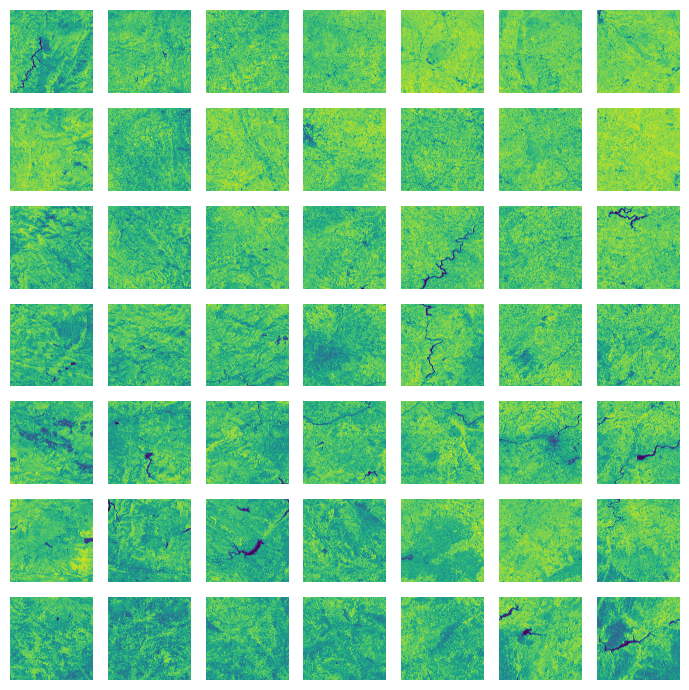

In [ ]:
band = 4  # Change this to the desired band number

def load_and_plot_tif_files(folder_path, num_rows, num_cols, channel=band, save_path=None):
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 1, num_rows * 1))
    for i in range(num_rows):
        for j in trange(num_cols):
            file_name = f"galicia_split_image_{j}_{i}.tif"
            file_path = os.path.join(folder_path, file_name)
            axis_name = f"{i}_{j}"
            try:
                if os.path.exists(file_path):
                    dataset = gdal.Open(file_path)
                    if dataset is not None:
                        data = dataset.ReadAsArray()
                        # Check if data has at least 2 dimensions and enough channels
                        if data.ndim > 2 and data.shape[0] >= channel:
                            # Select one channel to display (0 by default)
                            ax = axs[i, j] if num_rows > 1 and num_cols > 1 else axs[max(i, j)]
                            im = ax.imshow(data[channel, :, :], cmap='viridis')
                            # ax.title.set_text(axis_name)
                            ax.axis('off')
                        else:
                            print(f"Data in {file_name} does not meet expected shape or channel count, skipping...")
                    else:
                        print(f"Failed to open {file_name}")
                else:
                    print(f"{file_name} not found.")
            except Exception as e:
                print(f"Failed to load {file_name}: {e}")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)  # Save the figure to a file
    plt.show()

folder_path = "/content/drive/MyDrive/17_sat_tif_processed"  # Replace with the path to your processed .tif files
num_rows = 7    # Set the number of rows of the grid
num_cols = 7    # Set the number of columns of the grid
save_path = '/content/drive/MyDrive/visualisation.png'  # Specify the path to save the image
load_and_plot_tif_files(folder_path, num_rows, num_cols, channel=band, save_path=save_path)


### Transforming images to Torch Tensors

In the first step we want to transform our images into PyTorch tensors so they are able to be fed into the model.

We have already slices all images into (almost) equal dimensions of 2404x2403 pixels. The target shape is (5, 2400, 2400).

Using the Geospatial Data Abstraction Library (GDAL), we can easily read the geospatial images we just downloaded from Google Earth Engine. Now we can read the raster data from the image and return it as an NumPy array to then store it into Torch tensor, with a .pt extension.

In [ ]:
# Export images as new types (numpy and torch)
slices = 7
for idx in trange(slices):
    for jdx in trange(slices, leave=False):
        # Load image as array
        file_path_full = f"{file_path}_{idx}_{jdx}.tif"
        try:
            image_array = gdal.Open(file_path_full).ReadAsArray()
            print(f"--> image: {file_path_full} dimensions: {image_array.shape}")

            # Save image as torch
            file_path_torch = f"{file_path}_{idx}_{jdx}.pt"
            with open(file_path_torch, "wb") as f:
                torch.save(torch.tensor(image_array), f)
        except:
            print("File not found: ", file_path_full)

  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_0.tif dimensions: (5, 2403, 2403)



 14%|█▍        | 1/7 [00:02<00:16,  2.82s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_1.tif dimensions: (5, 2403, 2403)



 29%|██▊       | 2/7 [00:05<00:13,  2.71s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_2.tif dimensions: (5, 2403, 2403)



 43%|████▎     | 3/7 [00:09<00:12,  3.09s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_3.tif dimensions: (5, 2403, 2403)



 57%|█████▋    | 4/7 [00:10<00:07,  2.55s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_4.tif dimensions: (5, 2402, 2403)



 71%|███████▏  | 5/7 [00:15<00:06,  3.33s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_5.tif dimensions: (5, 2403, 2403)



 86%|████████▌ | 6/7 [00:17<00:02,  2.74s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_0_6.tif dimensions: (5, 2403, 2403)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_1_0.tif dimensions: (5, 2403, 2404)



 14%|█▍        | 1/7 [00:02<00:17,  2.97s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_1_1.tif dimensions: (5, 2403, 2404)



 29%|██▊       | 2/7 [00:08<00:21,  4.31s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_1_2.tif dimensions: (5, 2403, 2404)



 43%|████▎     | 3/7 [00:10<00:14,  3.53s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_1_3.tif dimensions: (5, 2403, 2404)



 57%|█████▋    | 4/7 [00:12<00:08,  2.96s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_1_4.tif dimensions: (5, 2402, 2404)



 71%|███████▏  | 5/7 [00:15<00:05,  2.80s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_1_5.tif dimensions: (5, 2403, 2404)



 86%|████████▌ | 6/7 [00:17<00:02,  2.55s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_1_6.tif dimensions: (5, 2403, 2404)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_2_0.tif dimensions: (5, 2403, 2403)



 14%|█▍        | 1/7 [00:06<00:40,  6.67s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_2_1.tif dimensions: (5, 2403, 2403)



 29%|██▊       | 2/7 [00:09<00:21,  4.22s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_2_2.tif dimensions: (5, 2403, 2403)



 43%|████▎     | 3/7 [00:11<00:12,  3.21s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_2_3.tif dimensions: (5, 2403, 2403)



 57%|█████▋    | 4/7 [00:14<00:09,  3.27s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_2_4.tif dimensions: (5, 2402, 2403)



 71%|███████▏  | 5/7 [00:16<00:05,  2.75s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_2_5.tif dimensions: (5, 2403, 2403)



 86%|████████▌ | 6/7 [00:20<00:03,  3.10s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_2_6.tif dimensions: (5, 2403, 2403)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_3_0.tif dimensions: (5, 2403, 2404)



 14%|█▍        | 1/7 [00:03<00:20,  3.39s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_3_1.tif dimensions: (5, 2403, 2404)



 29%|██▊       | 2/7 [00:05<00:13,  2.76s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_3_2.tif dimensions: (5, 2403, 2404)



 43%|████▎     | 3/7 [00:07<00:09,  2.39s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_3_3.tif dimensions: (5, 2403, 2404)



 57%|█████▋    | 4/7 [00:10<00:08,  2.70s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_3_4.tif dimensions: (5, 2402, 2404)



 71%|███████▏  | 5/7 [00:16<00:07,  3.60s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_3_5.tif dimensions: (5, 2403, 2404)



 86%|████████▌ | 6/7 [00:19<00:03,  3.53s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_3_6.tif dimensions: (5, 2403, 2404)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_4_0.tif dimensions: (5, 2403, 2403)



 14%|█▍        | 1/7 [00:02<00:13,  2.26s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_4_1.tif dimensions: (5, 2403, 2403)



 29%|██▊       | 2/7 [00:04<00:11,  2.22s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_4_2.tif dimensions: (5, 2403, 2403)



 43%|████▎     | 3/7 [00:06<00:07,  1.98s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_4_3.tif dimensions: (5, 2403, 2403)



 57%|█████▋    | 4/7 [00:08<00:05,  1.99s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_4_4.tif dimensions: (5, 2402, 2403)



 71%|███████▏  | 5/7 [00:10<00:04,  2.02s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_4_5.tif dimensions: (5, 2403, 2403)



 86%|████████▌ | 6/7 [00:16<00:03,  3.58s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_4_6.tif dimensions: (5, 2403, 2403)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_5_0.tif dimensions: (5, 2403, 2403)



 14%|█▍        | 1/7 [00:01<00:10,  1.73s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_5_1.tif dimensions: (5, 2403, 2403)



 29%|██▊       | 2/7 [00:03<00:09,  1.89s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_5_2.tif dimensions: (5, 2403, 2403)



 43%|████▎     | 3/7 [00:05<00:06,  1.67s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_5_3.tif dimensions: (5, 2403, 2403)



 57%|█████▋    | 4/7 [00:07<00:05,  1.81s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_5_4.tif dimensions: (5, 2402, 2403)



 71%|███████▏  | 5/7 [00:09<00:04,  2.03s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_5_5.tif dimensions: (5, 2403, 2403)



 86%|████████▌ | 6/7 [00:15<00:03,  3.38s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_5_6.tif dimensions: (5, 2403, 2403)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_6_0.tif dimensions: (5, 2403, 2404)



 14%|█▍        | 1/7 [00:04<00:24,  4.10s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_6_1.tif dimensions: (5, 2403, 2404)



 29%|██▊       | 2/7 [00:08<00:21,  4.33s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_6_2.tif dimensions: (5, 2403, 2404)



 43%|████▎     | 3/7 [00:12<00:16,  4.13s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_6_3.tif dimensions: (5, 2403, 2404)



 57%|█████▋    | 4/7 [00:16<00:11,  3.96s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_6_4.tif dimensions: (5, 2402, 2404)



 71%|███████▏  | 5/7 [00:17<00:06,  3.06s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_6_5.tif dimensions: (5, 2403, 2404)



 86%|████████▌ | 6/7 [00:20<00:02,  2.90s/it]

--> image: /content/drive/MyDrive/17_sat_tif_processed/galicia_split_image_6_6.tif dimensions: (5, 2403, 2404)



100%|██████████| 7/7 [02:25<00:00, 20.82s/it]


In [ ]:
# Define the source and destination directories
source_dir = '/content/drive/MyDrive/17_sat_tif'
destination_dir = '/content/drive/MyDrive/17_sat_pt'

# Ensure the destination directory exists, create if it doesn't
os.makedirs(destination_dir, exist_ok=True)

# Iterate over all files in the source directory
for filename in os.listdir(source_dir):
    if filename.endswith('.pt'):  # Check if the file has a .pt extension
        source_path = os.path.join(source_dir, filename)
        destination_path = os.path.join(destination_dir, filename)

        # Move the file
        shutil.move(source_path, destination_path)
        print(f"Moved: {filename} to {destination_dir}")


Moved: galicia_split_image_0_0.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_0_1.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_0_2.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_0_3.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_0_4.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_0_5.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_0_6.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_1_0.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_1_1.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_1_2.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_1_3.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_1_4.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_1_5.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split_image_1_6.pt to /content/drive/MyDrive/17_sat_pt
Moved: galicia_split

In [ ]:
image_path = "/content/drive/MyDrive/17_sat_pt/galicia_split_image_0_0.pt"
image = torch.load(image_path)
print(image.shape)
for i in range(image.shape[0]):  # Iterate over channels
    print(f"Channel {i}:")
    print(image[i, :5, :5])

torch.Size([5, 2403, 2403])
Channel 0:
tensor([[1051.0000, 1046.2500, 1055.7858, 1055.7858, 1036.4642],
        [1044.3214, 1040.4642, 1022.6071, 1022.6071, 1013.1786],
        [1031.1786, 1019.2857,  993.8214,  993.8214, 1007.8929],
        [1007.8571,  998.6786, 1021.1786, 1021.1786, 1041.5000],
        [ 999.6071, 1002.0714, 1038.0000, 1038.0000, 1075.5714]])
Channel 1:
tensor([[1159.5358, 1148.8928, 1148.5000, 1148.5000, 1131.9286],
        [1166.4642, 1151.6428, 1133.6428, 1133.6428, 1124.1428],
        [1167.1428, 1151.8928, 1129.6428, 1129.6428, 1133.5358],
        [1148.0000, 1145.7142, 1159.8214, 1159.8214, 1166.2858],
        [1135.6786, 1141.4286, 1169.4286, 1169.4286, 1191.8572]])
Channel 2:
tensor([[1353.2500, 1339.9642, 1337.7500, 1337.7500, 1322.5000],
        [1352.8572, 1342.1072, 1328.4286, 1328.4286, 1316.9642],
        [1355.2500, 1338.0714, 1325.4642, 1325.4642, 1329.1786],
        [1337.8572, 1333.7858, 1342.7142, 1342.7142, 1353.4642],
        [1329.5714, 1325.42

In [ ]:
# Define your input directories for satellite and ontology data
input_dir_satellite = "/content/drive/MyDrive/17_sat_pt"
output_dir_satellite = "/content/drive/MyDrive/17_sat_pt_processed"

os.makedirs(output_dir_satellite, exist_ok=True)  # Ensure the satellite output directory exists

# Get a list of all .pt files in the input directory that match satellite naming
files_satellite = [f for f in os.listdir(input_dir_satellite) if f.endswith('.pt') and not f.endswith('_ext.pt')]

# Function to process and save a single file
def process_and_save(file, input_dir, output_dir, is_ontology=False):
    # Load the image
    file_path = os.path.join(input_dir, file)
    image = torch.load(file_path)

    # Ensure image is truncated to 2400x2400
    truncated_image = image[:, :2400, :2400] if image.shape[1] > 2400 or image.shape[2] > 2400 else image

    # Construct the new file name
    base_name = file.split('.')[0]  # Remove .pt extension
    new_name = f"{base_name}.pt"  # Append .pt again to keep the extension

    # Save the processed image
    save_path = os.path.join(output_dir, new_name)
    torch.save(truncated_image, save_path)

    # Get the shape of the new tensors
    shape = truncated_image.shape

    # Print output for confirmation
    print(f"Processed and saved: {save_path}, new dimensions: {shape}")

# Process satellite images
for file in files_satellite:
    process_and_save(file, input_dir_satellite, output_dir_satellite)

Processed and saved: /content/drive/MyDrive/17_sat_pt_processed/galicia_split_image_0_0.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/17_sat_pt_processed/galicia_split_image_0_1.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/17_sat_pt_processed/galicia_split_image_0_2.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/17_sat_pt_processed/galicia_split_image_0_3.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/17_sat_pt_processed/galicia_split_image_0_4.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/17_sat_pt_processed/galicia_split_image_0_5.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/17_sat_pt_processed/galicia_split_image_0_6.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/17_s

### Visualize tensors

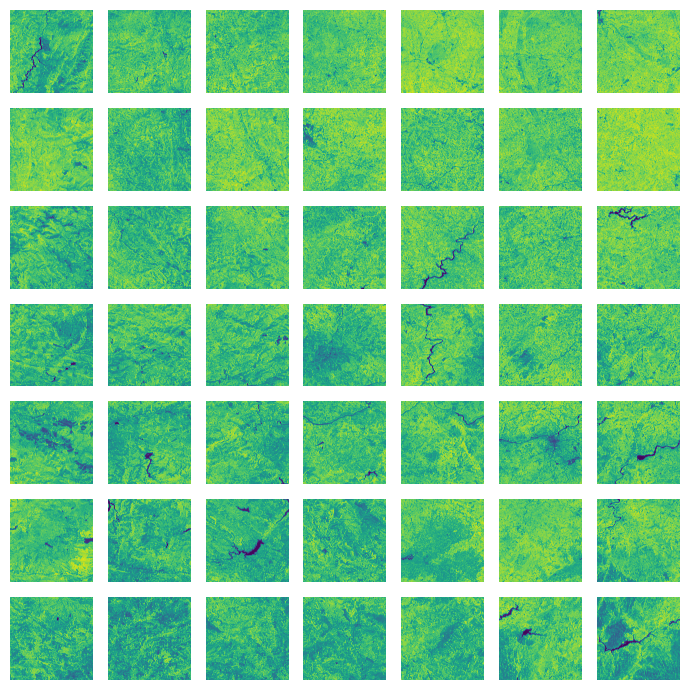

In [ ]:
import torch
import matplotlib.pyplot as plt
import os

band = 4  # Change this to the desired band number

def load_and_plot_pt_files(folder_path, num_rows, num_cols, channel=band, save_path=None):
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 1, num_rows * 1))
    for i in range(num_rows):
        for j in range(num_cols):
         #   col_index = num_cols - 1 -j
            file_name = f"galicia_split_image_{j}_{i}.pt"
            file_path = os.path.join(folder_path, file_name)
            axis_name = f"{i}_{j}"
            try:
                if os.path.exists(file_path):
                    data = torch.load(file_path)
                    # Check if data has at least 2 dimensions and enough channels
                    if data.ndim > 2 and data.shape[0] >= channel:
                        # Select one channel to display (0 by default)
                        ax = axs[i, j] if num_rows > 1 and num_cols > 1 else axs[max(i, j)]
                        im = ax.imshow(data[channel, :, :], cmap='viridis')
                       # ax.title.set_text(axis_name)
                        ax.axis('off')
                    else:
                        print(f"Data in {file_name} does not meet expected shape or channel count, skipping...")
                else:
                    print(f"{file_name} not found.")
            except Exception as e:
                print(f"Failed to load {file_name}: {e}")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)  # Save the figure to a file
    plt.show()

folder_path = "/content/drive/MyDrive/17_sat_pt_processed"  # Replace with the path to your .pt files
num_rows = 7    # Set the number of rows of the grid
num_cols = 7    # Set the number of columns of the grid
save_path = '/content/drive/MyDrive/visualisation.png'  # Specify the path to save the image
load_and_plot_pt_files(folder_path, num_rows, num_cols, channel=band, save_path=save_path)


### Preparing correct dimensions 2400 --> 256

In [ ]:
def process_tensors(input_dir, output_dir, original_size=(2400, 2400), patch_size=(256, 256)):
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Iterate over all files in the input directory
    for filename in os.listdir(input_dir):
        if filename.endswith('.pt'):  # Assuming the tensors are saved with '.pt' extension
            # Load the tensor
            tensor_path = os.path.join(input_dir, filename)
            tensor = torch.load(tensor_path)

            # Process each tensor
            row_idx = 0
            for i in trange(0, original_size[0], patch_size[0]):
                col_idx = 0
                for j in range(0, original_size[1], patch_size[1]):
                    # Check if the patch would be outside the bounds of the tensor
                    if i + patch_size[0] <= original_size[0] and j + patch_size[1] <= original_size[1]:
                        patch = crop(tensor, i, j, patch_size[0], patch_size[1])
                        # Ensure the patch is a separate tensor
                        patch = patch.clone()  # This makes sure the patch is a deep copy
                        # Naming patches based on row and column index
                        patch_filename = f"{filename[:-3]}_patch_{row_idx}_{col_idx}.pt"
                        patch_path = os.path.join(output_dir, patch_filename)
                        # Debug: Print patch info
                     #   print(f"Saving {patch_filename}: shape {patch.shape}, size on disk approx.")
                        torch.save(patch, patch_path)
                        col_idx += 1
                row_idx += 1
            print(f"Processed {filename} into patches, saved in {output_dir}")

# Define paths
input_dir = '/content/drive/MyDrive/18_sat_pt_processed'
output_dir = '/content/drive/MyDrive/18_sat_pt_256'

# Process the tensors
process_tensors(input_dir, output_dir)


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_4.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_5.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_6.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_0.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_1.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_2.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_3.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_4.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_5.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_6.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_0.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_1.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_2.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_3.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_4.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_5.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_6.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_0.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_1.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_2.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_3.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_4.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_5.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_6.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_0.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_1.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_2.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_3.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_4.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_5.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_6.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_0.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_1.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_2.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_3.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_4.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_5.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_6.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_0.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_1.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_2.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_3.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_4.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_5.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_6.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_0.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_1.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_2.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_3.pt into patches, saved in /content/drive/MyDrive/18_sat_pt_256


In [ ]:
# checking the tensor shapes

def get_tensor_shape(file_path):
    """
    Load a tensor from the given file path and return its shape.

    Args:
    file_path (str): Path to the tensor file.

    Returns:
    torch.Size: Shape of the loaded tensor.
    """
    tensor = torch.load(file_path)
    return tensor.shape

file_path = '/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt'
tensor_shape = get_tensor_shape(file_path)
print(f"The shape of the tensor is: {tensor_shape}")

The shape of the tensor is: torch.Size([5, 256, 256])


# 2. Preprocessing Ontology Features

In [ ]:
# Load image info
file_path = "/content/drive/MyDrive/17_sat_tif/galicia_split_image"
file_path_info = f"{file_path}.pickle"
with open(file_path_info, "rb") as f:
    coord_dict = pickle.load(f)
print(coord_dict)

{(0, 0): ((-6.711535, 43.308103), (-6.927347142857143, 43.09229085714286)), (0, 1): ((-6.711535, 43.09229085714286), (-6.927347142857143, 42.87647871428572)), (0, 2): ((-6.711535, 42.87647871428572), (-6.927347142857143, 42.66066657142857)), (0, 3): ((-6.711535, 42.66066657142857), (-6.927347142857143, 42.44485442857143)), (0, 4): ((-6.711535, 42.44485442857143), (-6.927347142857143, 42.229042285714286)), (0, 5): ((-6.711535, 42.229042285714286), (-6.927347142857143, 42.01323014285715)), (0, 6): ((-6.711535, 42.01323014285715), (-6.927347142857143, 41.797418)), (1, 0): ((-6.927347142857143, 43.308103), (-7.143159285714286, 43.09229085714286)), (1, 1): ((-6.927347142857143, 43.09229085714286), (-7.143159285714286, 42.87647871428572)), (1, 2): ((-6.927347142857143, 42.87647871428572), (-7.143159285714286, 42.66066657142857)), (1, 3): ((-6.927347142857143, 42.66066657142857), (-7.143159285714286, 42.44485442857143)), (1, 4): ((-6.927347142857143, 42.44485442857143), (-7.143159285714286, 4

In [ ]:
# Feature ontology path
ont_dir = "17_ont_pickles"
folder_path = f"{drive_path}/MyDrive/{ont_dir}"

file_name = "ont_features"
file_path = f"{folder_path}/{file_name}"

slices = 7

In [ ]:
for idx in trange(slices):
    for jdx in trange(slices, leave=False):
        file_path_pandas = f"{file_path}_{idx}_{jdx}.pickle"
        data = pd.read_pickle(file_path_pandas)
        if idx == 0 and jdx == 0:
            data_whole = data
        else:
            data_whole = pd.concat([data_whole, data], axis=0)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
import pandas as pd

pickle_file = "/content/drive/MyDrive/17_ont_pickles/ont_features_0_0.pickle"

# Load the DataFrame from the pickle file
data_batch = pd.read_pickle(pickle_file)

# Calculate max and min of xcoords
max_xcoord = data_batch['xcoord'].max()
min_xcoord = data_batch['xcoord'].min()

# Format the output to display as ((min, max))
result = ((min_xcoord, max_xcoord),)
print(result)

# should be: ((0, 0), ((-6.711535, 43.308103), (-6.927347142857143, 43.09229085714286))),

((-6.919133, -6.711556),)


In [ ]:
import pandas as pd

pickle_file = "/content/drive/MyDrive/17_ont_pickles/ont_features_0_0.pickle"

# Load the DataFrame from the pickle file
data_batch = pd.read_pickle(pickle_file)

# Check if 'xcoord' column exists and display its content
if 'xcoord' in data_batch.columns:
    print("xcoord column exists.")
    print(data_batch['xcoord'].head())
else:
    print("xcoord column does not exist.")


xcoord column exists.
51316   -6.861122
51317   -6.861242
51318   -6.861156
51319   -6.861154
51320   -6.861149
Name: xcoord, dtype: float64


In [ ]:
data_whole['xcoord']
min_xcoord = data_whole['xcoord'].min()
max_xcoord = data_whole['xcoord'].max()

print(f"Min value of 'xcoord': {min_xcoord}")
print(f"Max value of 'xcoord': {max_xcoord}")

min_xcoord = data_whole['ycoord'].min()
max_xcoord = data_whole['ycoord'].max()

print(f"Min value of 'ycoord': {min_xcoord}")
print(f"Max value of 'ycoord': {max_xcoord}")

Min value of 'xcoord': -8.157639
Max value of 'xcoord': -6.711556
Min value of 'ycoord': 41.825591
Max value of 'ycoord': 43.305009


In [ ]:
def get_matching_index(lat_tree, lon_tree, coord_dict):
    for key, ((max_lat, max_lon), (min_lat, min_lon)) in coord_dict.items():
        test_1 = min_lon <= float(lon_tree) <= max_lon
        test_2 = min_lat <= float(lat_tree) <= max_lat
        if test_1 and test_2:
            return key
    raise ValueError(f"No bounding box contains the point: {lat_tree}, {lon_tree}")

In [ ]:
print(coord_dict.items())

dict_items([((0, 0), ((-6.711535, 43.308103), (-6.927347142857143, 43.09229085714286))), ((0, 1), ((-6.711535, 43.09229085714286), (-6.927347142857143, 42.87647871428572))), ((0, 2), ((-6.711535, 42.87647871428572), (-6.927347142857143, 42.66066657142857))), ((0, 3), ((-6.711535, 42.66066657142857), (-6.927347142857143, 42.44485442857143))), ((0, 4), ((-6.711535, 42.44485442857143), (-6.927347142857143, 42.229042285714286))), ((0, 5), ((-6.711535, 42.229042285714286), (-6.927347142857143, 42.01323014285715))), ((0, 6), ((-6.711535, 42.01323014285715), (-6.927347142857143, 41.797418))), ((1, 0), ((-6.927347142857143, 43.308103), (-7.143159285714286, 43.09229085714286))), ((1, 1), ((-6.927347142857143, 43.09229085714286), (-7.143159285714286, 42.87647871428572))), ((1, 2), ((-6.927347142857143, 42.87647871428572), (-7.143159285714286, 42.66066657142857))), ((1, 3), ((-6.927347142857143, 42.66066657142857), (-7.143159285714286, 42.44485442857143))), ((1, 4), ((-6.927347142857143, 42.44485

In [ ]:
sorted_indices = {key: [] for key in coord_dict.keys()}

for idx in tqdm(range(len(data_whole))):
    # Get data item
    data_i = data_whole.iloc[idx]

    # Get longitute and latitute of tree
    lat_tree, lon_tree = data_i["xcoord"], data_i["ycoord"]

    # Check in which area the tree falls
    image_index = get_matching_index(lat_tree, lon_tree, coord_dict)

    # Store idx to image_index mapping
    sorted_indices[image_index].append(idx)

  0%|          | 0/45584 [00:00<?, ?it/s]

In [ ]:
def geo_to_pixel(lat, lon, lat_range, lon_range, img_dimensions):
    """
    Convert geographical coordinates to pixel coordinates on a map image.

    Parameters:
    - lat, lon: float, geographical coordinates (latitude and longitude)
    - lat_range: tuple, (min_latitude, max_latitude)
    - lon_range: tuple, (min_longitude, max_longitude)
    - img_dimensions: tuple, (width, height) of the image in pixels

    Returns:
    - (x, y): tuple, pixel coordinates corresponding to the geographical location
    """
    min_lat, max_lat = lat_range
    min_lon, max_lon = lon_range
    width, height = img_dimensions

    # Calculate the relative position of the coordinates within the range
    lat_percent = (lat - min_lat) / (max_lat - min_lat)
    lon_percent = (lon - min_lon) / (max_lon - min_lon)

    # Convert to pixel coordinates
    # Note: Pixel (0,0) is at the top-left corner, so we invert the y coordinate
    x = int(lon_percent * width)
    y = int((1 - lat_percent) * height)

    return (x, y)


def expanded_assign(target_layer, px, py, data, radius=50):
    norm_r = radius // 2
    max_x, max_y = target_layer.shape

    # Calculate bounds for the area to update
    min_x = max(0, px - norm_r)
    max_x = min(max_x, px + norm_r)
    min_y = max(0, py - norm_r)
    max_y = min(max_y, py + norm_r)

    # Use slicing to update the sub-matrix in one operation
    target_layer[min_x:max_x, min_y:max_y] += data

    return target_layer

In [ ]:
# File path setup
img_dir = "18_sat_pt_processed"
folder_path = f"{drive_path}/MyDrive/{img_dir}"

# Image path & scale for Sentinel-2A download
file_name = "galicia_split_image"  # Name of the .tif file
file_path = f"{folder_path}/{file_name}"
scale = 10  # pixels per meter
AS_TYPE = torch.float32
slices = 7

In [ ]:
new_dims = 3

for image_index, idx_list in tqdm(sorted_indices.items()):
    # Get range of coordinates by image
    ((max_lat, max_lon), (min_lat, min_lon)) = coord_dict[image_index]
    lat_range, lon_range = (min_lat, max_lat), (min_lon, max_lon)

    # Save image as torch
    idx, jdx = image_index
    file_path_torch = f"{file_path}_{idx}_{jdx}.pt"
    try:
        image = torch.load(file_path_torch)
    except FileNotFoundError:
        print("File not found: ", file_path_torch)
        continue

    # Create empty onotology layers
    depth, width, height = image.shape
    target_layer = torch.zeros((new_dims, width, height)).to(AS_TYPE)

    for i in idx_list:
        # Get data item
        data_i = data_whole.iloc[i]

        # Get longitute and latitute of tree
        lat_tree, lon_tree = data_i["xcoord"], data_i["ycoord"]

        # Find mapping of pixel
        px, py = geo_to_pixel(lat_tree, lon_tree, lat_range, lon_range, (width, height))

        # Populate ontology layers w/ values
        target_layer[0, :, :] = expanded_assign(
            target_layer[0, :, :], px, py, data_i["height"]
        )
        target_layer[1, :, :] = expanded_assign(
            target_layer[1, :, :], px, py, data_i["firewood"]
        )
        target_layer[2, :, :] = expanded_assign(
            target_layer[2, :, :], px, py, data_i["species_number"]
        )

    image = np.vstack((image, target_layer))
    torch.save(torch.tensor(image), f"{file_path}_{idx}_{jdx}_ext.pt")

  0%|          | 0/49 [00:00<?, ?it/s]

In [ ]:
import os
slices = 7
band = 4
file_path = '/content/drive/MyDrive/18_ont_pt_processed_rad50'
for idx in trange(slices):
    for jdx in trange(slices, leave=False):
        file_path_torch_ext = f"{file_path}_{idx}_{jdx}_ext.pt"
        try:
            image_array = torch.load(file_path_torch_ext)
            print(f"--> image: {file_path_torch_ext} dimensions: {image_array.shape}")
            img = image_array[band, :, :] * 40
            img += image_array[5, :, :] * 20
            #img += image_array[6, :, :] * 20
            #img += image_array[7, :, :] * 20
            plt.imshow(img, cmap="viridis")
            plt.axis("off")
            plt.show()
            break
            axs[slices - jdx - 1, idx].imshow(img, cmap="viridis")
            axs[slices - jdx - 1, idx].axis("off")
        except FileNotFoundError:
            print("File not found: ", file_path_torch_ext)
        break
    break

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

File not found:  /content/drive/MyDrive/18_ont_pt_processed_rad50_0_0_ext.pt


In [ ]:
# Define the source and destination directories
source_dir = '/content/drive/MyDrive/18_sat_pt_processed'
destination_dir = '/content/drive/MyDrive/18_ont_pt_processed_rad50'

# Ensure the destination directory exists, create if it doesn't
os.makedirs(destination_dir, exist_ok=True)

# Iterate over all files in the source directory
for filename in os.listdir(source_dir):
    if filename.endswith('_ext.pt'):  # Check if the file has a .pt extension
        source_path = os.path.join(source_dir, filename)
        destination_path = os.path.join(destination_dir, filename)

        # Move the file
        shutil.move(source_path, destination_path)
        print(f"Moved: {filename} to {destination_dir}")

Moved: galicia_split_image_0_0_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_0_1_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_0_2_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_0_3_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_0_4_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_0_5_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_0_6_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_1_0_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_1_1_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_1_2_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: galicia_split_image_1_3_ext.pt to /content/drive/MyDrive/18_ont_pt_processed_rad50
Moved: gal

In [ ]:
def process_tensors(input_dir, output_dir, original_size=(2400, 2400), patch_size=(256, 256)):
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Iterate over all files in the input directory
    for filename in os.listdir(input_dir):
        if filename.endswith('.pt'):  # Assuming the tensors are saved with '.pt' extension
            # Load the tensor
            tensor_path = os.path.join(input_dir, filename)
            tensor = torch.load(tensor_path)

            # Process each tensor
            row_idx = 0
            for i in trange(0, original_size[0], patch_size[0]):
                col_idx = 0
                for j in range(0, original_size[1], patch_size[1]):
                    # Check if the patch would be outside the bounds of the tensor
                    if i + patch_size[0] <= original_size[0] and j + patch_size[1] <= original_size[1]:
                        patch = crop(tensor, i, j, patch_size[0], patch_size[1])
                        # Ensure the patch is a separate tensor
                        patch = patch.clone()  # This makes sure the patch is a deep copy
                        # Naming patches based on row and column index
                        patch_filename = f"{filename[:-3]}_patch_{row_idx}_{col_idx}.pt"
                        patch_path = os.path.join(output_dir, patch_filename)
                        # Debug: Print patch info
                     #   print(f"Saving {patch_filename}: shape {patch.shape}, size on disk approx.")
                        torch.save(patch, patch_path)
                        col_idx += 1
                row_idx += 1
            print(f"Processed {filename} into patches, saved in {output_dir}")

# Define paths
input_dir = '/content/drive/MyDrive/18_ont_pt_processed_rad50'
output_dir = '/content/drive/MyDrive/18_ont_pt_256_rad50'

# Process the tensors
process_tensors(input_dir, output_dir)


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_0_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_1_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_2_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_3_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_4_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_5_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_0_6_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_0_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_1_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_2_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_3_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_4_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_5_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_1_6_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_0_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_1_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_2_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_3_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_4_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_5_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_2_6_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_0_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_1_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_2_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_3_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_4_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_5_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_3_6_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_0_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_1_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_2_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_3_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_4_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_5_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_4_6_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_0_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_1_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_2_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_3_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_4_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_5_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_5_6_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_0_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_1_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_2_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_3_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_4_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_5_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


  0%|          | 0/10 [00:00<?, ?it/s]

Processed galicia_split_image_6_6_ext.pt into patches, saved in /content/drive/MyDrive/18_ont_pt_256_rad50


## Visualizing patches

### One patch

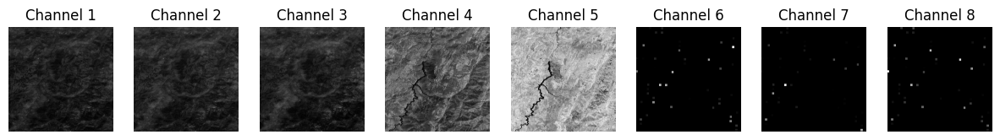

In [ ]:
import torch
import matplotlib.pyplot as plt

def visualize_tensor(path):
    # Load the tensor
    tensor = torch.load(path)

    # Normalize the tensor to 0-1 range for visualization
    tensor = (tensor - tensor.min()) / (tensor.max() - tensor.min())

    # Number of channels in the tensor
    num_channels = tensor.shape[0]

    # Create a figure with subplots
    fig, axes = plt.subplots(1, num_channels, figsize=(15, 5))  # Adjust the figure size as needed

    for i in range(num_channels):
        ax = axes[i]
        # Select the channel and convert it to numpy for visualization
        channel_image = tensor[i].numpy()
        # Display the image
        ax.imshow(channel_image, cmap='gray')  # Using grayscale colormap
        ax.axis('off')  # Turn off axis numbers and ticks
        ax.set_title(f'Channel {i+1}')

    plt.show()

# Define the path to the tensor
path = '/content/drive/MyDrive/17_ont_pt_processed_rad50/galicia_split_image_0_0_ext.pt'


# Visualize the tensor
visualize_tensor(path)

### One row of patches

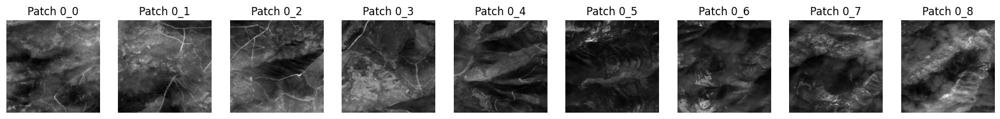

In [ ]:
import torch
import matplotlib.pyplot as plt

def visualize_patches(base_path, file_prefix, start_patch, end_patch):
    # Normalize and visualize each patch from patch_0_0 to patch_0_8
    fig, axes = plt.subplots(1, end_patch - start_patch + 1, figsize=(20, 4))  # Adjust size as needed

    for idx, ax in enumerate(axes):
        patch_num = start_patch + idx
        # Construct full path to the tensor
        path = f"{base_path}/{file_prefix}_patch_0_{patch_num}.pt"
        tensor = torch.load(path)

        # Normalize the tensor to 0-1 range for visualization
        tensor = (tensor - tensor.min()) / (tensor.max() - tensor.min())

        # Assuming the tensor's shape is [C, H, W] and it has more than 1 channel
        # For simplicity, just visualize the first channel
        channel_image = tensor[0].numpy()  # Using the first channel

        # Display the image
        ax.imshow(channel_image, cmap='gray')  # Using grayscale colormap
        ax.axis('off')  # Turn off axis numbers and ticks
        ax.set_title(f'Patch 0_{patch_num}')

    plt.show()


# Base path to the patches
base_path = '/content/drive/MyDrive/17_sat_pt_256/'
# Prefix in the filename before patch identifiers
file_prefix = 'galicia_split_image_0_1'
# Start and end indices for the patches
start_patch = 0
end_patch = 8

# Visualize the patches
visualize_patches(base_path, file_prefix, start_patch, end_patch)


### One entire tensor with 96 patches

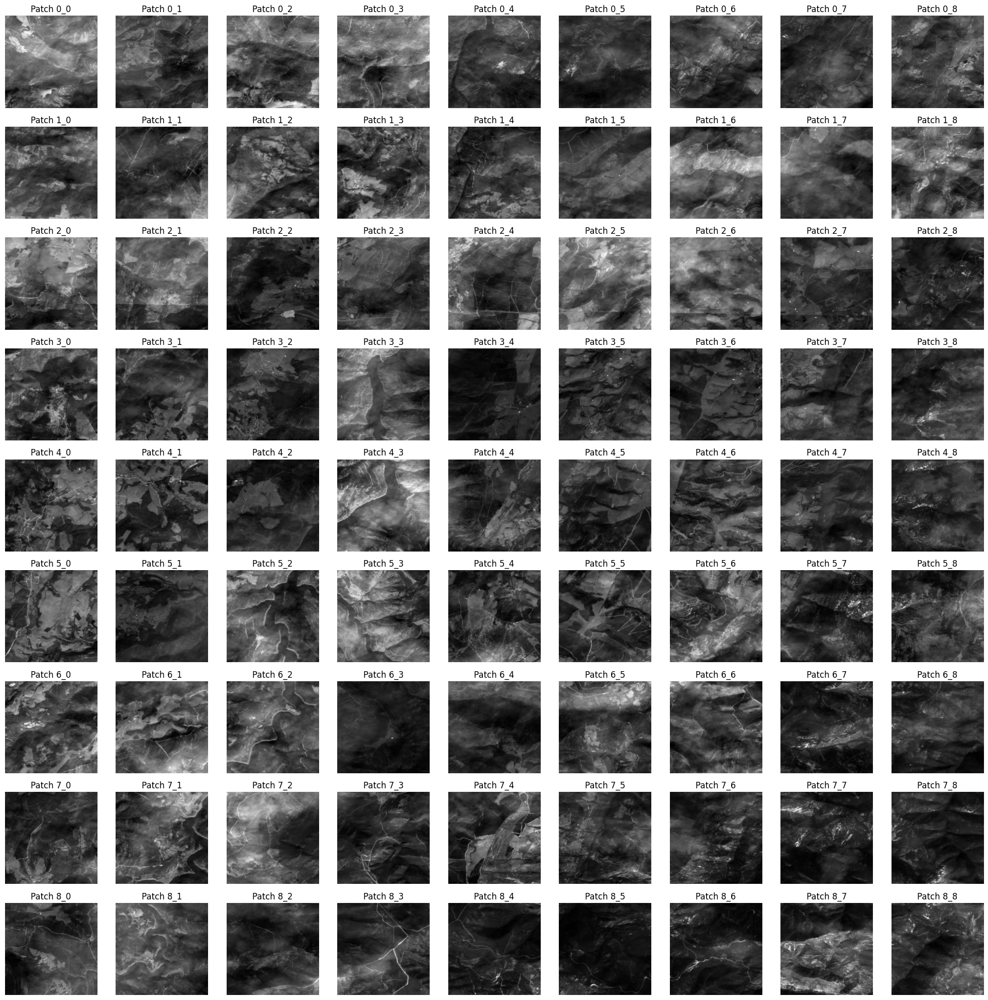

In [ ]:
import torch
import matplotlib.pyplot as plt
import os

def reconstruct_tensor(base_path, file_prefix):
    # Define the size of the original tensor and the patches
    original_size = (8, 2400, 2400)  # Assuming 5 channels
    patch_size = (8, 256, 256)
    patches_per_dim = 9

    # Create an empty tensor to hold the reconstructed image
    reconstructed_tensor = torch.zeros(original_size)

    # Iterate over each patch position
    for row_idx in range(patches_per_dim):
        for col_idx in range(patches_per_dim):
            # Construct the full path to the tensor
            path = f"{base_path}/{file_prefix}_patch_{row_idx}_{col_idx}.pt"
            if os.path.exists(path):
                patch = torch.load(path)

                # Determine where this patch goes in the reconstructed tensor
                row_start = row_idx * patch_size[1]
                col_start = col_idx * patch_size[2]
                row_end = row_start + patch_size[1]
                col_end = col_start + patch_size[2]

                # Place the patch in the correct location in the reconstructed tensor
                reconstructed_tensor[:, row_start:row_end, col_start:col_end] = patch
            else:
                print(f"Patch {row_idx}_{col_idx} not found. Skipping.")

    return reconstructed_tensor

def visualize_patches_in_grid(base_path, file_prefix):
    # Define the size of the patches
    patch_size = (8, 256, 256)
    patches_per_dim = 9

    # Prepare the figure for visualization
    fig, axes = plt.subplots(patches_per_dim, patches_per_dim, figsize=(20, 20))  # Adjust size as needed

    for row_idx in range(patches_per_dim):
        for col_idx in range(patches_per_dim):
            ax = axes[row_idx, col_idx]
            # Construct full path to the tensor
            path = f"{base_path}/{file_prefix}_patch_{row_idx}_{col_idx}.pt"
            if os.path.exists(path):
                tensor = torch.load(path)

                # Normalize the tensor to 0-1 range for visualization
                tensor = (tensor - tensor.min()) / (tensor.max() - tensor.min())

                # Use the first channel for visualization
                channel_image = tensor[0].numpy()  # Using the first channel

                # Display the image
                ax.imshow(channel_image, cmap='gray')  # Using grayscale colormap
                ax.axis('off')  # Turn off axis numbers and ticks
                ax.set_title(f'Patch {row_idx}_{col_idx}')
            else:
                ax.axis('off')  # Hide the axis if patch is not found
                ax.set_title(f'Missing {row_idx}_{col_idx}')

    plt.tight_layout()
    plt.show()

# Base path to the patches
base_path = '/content/drive/MyDrive/17_ont_pt_256_rad50'
# Prefix in the filename before patch identifiers
file_prefix = 'galicia_split_image_0_0_ext'

# Visualize patches in a grid layout
visualize_patches_in_grid(base_path, file_prefix)


# 3. Generating labels (2018)



### Defining paths

In [ ]:
# File path setup
img_dir = "17_sat_tif_processed"
folder_path = f"{drive_path}/MyDrive/{img_dir}"

# Image path & scale
file_name = "galicia_split_image"
file_path = f"{folder_path}/{file_name}"
scale = 10  # pixels per meter
AS_TYPE = torch.float32

### Checking Nan edges

100%|██████████| 7/7 [00:13<00:00,  1.98s/it]


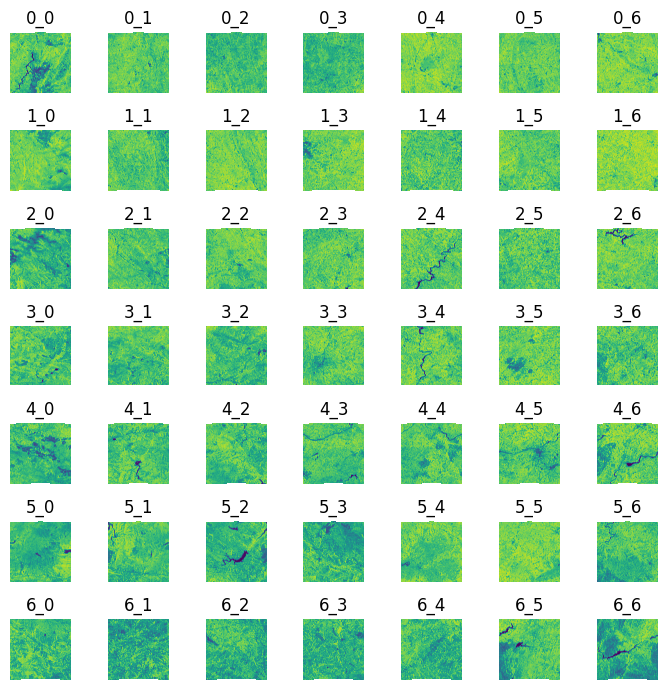

In [ ]:
band = 4  # Change this to the desired band number

def load_and_plot_tif_files(folder_path, num_rows, num_cols, channel=band, save_path=None):
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 1, num_rows * 1))
    for i in range(num_rows):
        for j in trange(num_cols):
            file_name = f"galicia_split_image_{j}_{i}.tif"
            file_path = os.path.join(folder_path, file_name)
            axis_name = f"{i}_{j}"
            try:
                if os.path.exists(file_path):
                    dataset = gdal.Open(file_path)
                    if dataset is not None:
                        data = dataset.ReadAsArray()
                        # Check if data has at least 2 dimensions and enough channels
                        if data.ndim > 2 and data.shape[0] >= channel:
                            # Select one channel to display (0 by default)
                            ax = axs[i, j] if num_rows > 1 and num_cols > 1 else axs[max(i, j)]
                            im = ax.imshow(data[channel, :, :], cmap='viridis')
                            ax.title.set_text(axis_name)
                            ax.axis('off')
                        else:
                            print(f"Data in {file_name} does not meet expected shape or channel count, skipping...")
                    else:
                        print(f"Failed to open {file_name}")
                else:
                    print(f"{file_name} not found.")
            except Exception as e:
                print(f"Failed to load {file_name}: {e}")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)  # Save the figure to a file
    plt.show()

folder_path = "/content/drive/MyDrive/18_sat_tif"  # Replace with the path to your .tif files
num_rows = 7    # Set the number of rows of the grid
num_cols = 7    # Set the number of columns of the grid
save_path = '/content/drive/MyDrive/visualisation.png'  # Specify the path to save the image
load_and_plot_tif_files(folder_path, num_rows, num_cols, channel=band, save_path=save_path)


## Transform .tif images to (5, 2400, 2400) Torch tensors for 2018

### Removing the NaN values ans save new .tif

In [ ]:
def remove_nan_rows(data):
    """Remove rows that contain NaN values from any band."""
    # Create a mask for rows without NaNs across all bands
    mask = ~np.isnan(data).any(axis=(0, 2))
    return data[:, mask, :]

def save_as_tif(data, file_path, original_dataset):
    """Save the NumPy array as a .tif file using the original dataset's metadata."""
    driver = gdal.GetDriverByName("GTiff")
    out_dataset = driver.Create(file_path, data.shape[2], data.shape[1], data.shape[0], gdal_array.NumericTypeCodeToGDALTypeCode(data.dtype))

    # Copy geo-transform and projection from the original dataset
    out_dataset.SetGeoTransform(original_dataset.GetGeoTransform())
    out_dataset.SetProjection(original_dataset.GetProjection())

    for i in range(data.shape[0]):
        out_dataset.GetRasterBand(i + 1).WriteArray(data[i])

    out_dataset.FlushCache()
    out_dataset = None

def process_and_save_tif_files(input_folder_path, output_folder_path, num_rows, num_cols):
    if not os.path.exists(output_folder_path):
        os.makedirs(output_folder_path)

    for i in range(num_rows):
        for j in range(num_cols):
            file_name = f"galicia_split_image_{j}_{i}.tif"
            file_path = os.path.join(input_folder_path, file_name)
            output_file_path = os.path.join(output_folder_path, f"galicia_split_image_{j}_{i}.tif")
            try:
                if os.path.exists(file_path):
                    dataset = gdal.Open(file_path)
                    if dataset is not None:
                        data = dataset.ReadAsArray()
                        # Remove rows with NaN values from all bands
                        cleaned_data = remove_nan_rows(data)
                        # Save the cleaned data as a .tif file
                        save_as_tif(cleaned_data, output_file_path, dataset)
                        print(f"Processed and saved: {output_file_path}, new dimensions: {cleaned_data.shape}")
                    else:
                        print(f"Failed to open {file_name}")
                else:
                    print(f"{file_name} not found.")
            except Exception as e:
                print(f"Failed to process {file_name}: {e}")

input_folder_path = "/content/drive/MyDrive/18_sat_tif"  # Path to your original .tif files
output_folder_path = "/content/drive/MyDrive/18_sat_tif_processed"  # Path to save processed files
num_rows = 7  # Number of rows in the grid
num_cols = 7  # Number of columns in the grid

process_and_save_tif_files(input_folder_path, output_folder_path, num_rows, num_cols)


Processed and saved: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_0.tif, new dimensions: (5, 2403, 2403)
Processed and saved: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_1_0.tif, new dimensions: (5, 2403, 2404)
Processed and saved: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_2_0.tif, new dimensions: (5, 2403, 2403)
Processed and saved: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_3_0.tif, new dimensions: (5, 2403, 2404)
Processed and saved: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_4_0.tif, new dimensions: (5, 2403, 2403)
Processed and saved: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_5_0.tif, new dimensions: (5, 2403, 2403)
Processed and saved: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_6_0.tif, new dimensions: (5, 2403, 2404)
Processed and saved: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_1.tif, new dimensions: (5, 2403

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

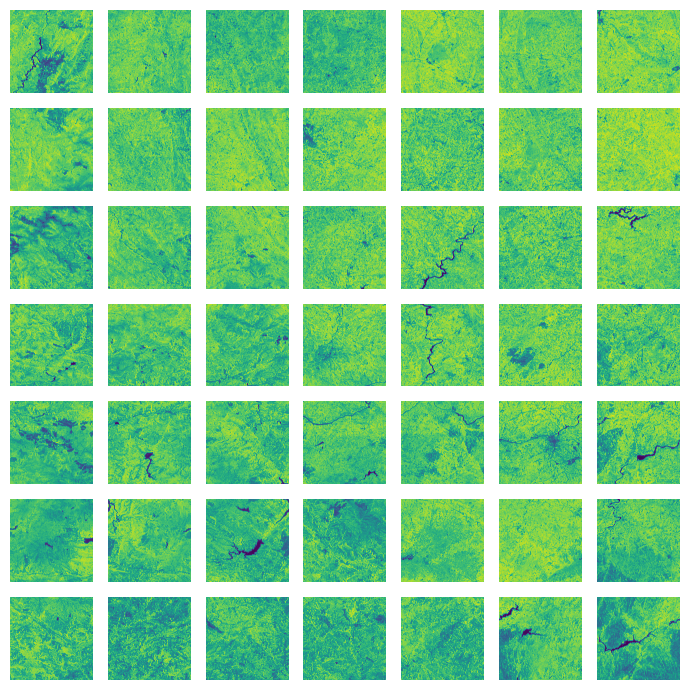

In [ ]:
band = 4  # Change this to the desired band number

def load_and_plot_tif_files(folder_path, num_rows, num_cols, channel=band, save_path=None):
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 1, num_rows * 1))
    for i in range(num_rows):
        for j in trange(num_cols):
            file_name = f"galicia_split_image_{j}_{i}.tif"
            file_path = os.path.join(folder_path, file_name)
            axis_name = f"{i}_{j}"
            try:
                if os.path.exists(file_path):
                    dataset = gdal.Open(file_path)
                    if dataset is not None:
                        data = dataset.ReadAsArray()
                        # Check if data has at least 2 dimensions and enough channels
                        if data.ndim > 2 and data.shape[0] >= channel:
                            # Select one channel to display (0 by default)
                            ax = axs[i, j] if num_rows > 1 and num_cols > 1 else axs[max(i, j)]
                            im = ax.imshow(data[channel, :, :], cmap='viridis')
                            # ax.title.set_text(axis_name)
                            ax.axis('off')
                        else:
                            print(f"Data in {file_name} does not meet expected shape or channel count, skipping...")
                    else:
                        print(f"Failed to open {file_name}")
                else:
                    print(f"{file_name} not found.")
            except Exception as e:
                print(f"Failed to load {file_name}: {e}")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)  # Save the figure to a file
    plt.show()

folder_path = "/content/drive/MyDrive/18_sat_tif_processed"  # Replace with the path to your processed .tif files
num_rows = 7    # Set the number of rows of the grid
num_cols = 7    # Set the number of columns of the grid
save_path = '/content/drive/MyDrive/visualisation.png'  # Specify the path to save the image
load_and_plot_tif_files(folder_path, num_rows, num_cols, channel=band, save_path=save_path)


### Transforming images to Torch Tensors

In the first step we want to transform our images into PyTorch tensors so they are able to be fed into the model.

We have already slices all images into (almost) equal dimensions of 2404x2403 pixels. The target shape is (5, 2400, 2400).

Using the Geospatial Data Abstraction Library (GDAL), we can easily read the geospatial images we just downloaded from Google Earth Engine. Now we can read the raster data from the image and return it as an NumPy array to then store it into Torch tensor, with a .pt extension.

In [ ]:
#img_dir should be 18_sat_tif_processed!!!

# Export images as new types (numpy and torch)
slices = 7
for idx in trange(slices):
    for jdx in trange(slices, leave=False):
        # Load image as array
        file_path_full = f"{file_path}_{idx}_{jdx}.tif"
        try:
            image_array = gdal.Open(file_path_full).ReadAsArray()
            print(f"--> image: {file_path_full} dimensions: {image_array.shape}")

            # Save image as torch
            file_path_torch = f"{file_path}_{idx}_{jdx}.pt"
            with open(file_path_torch, "wb") as f:
                torch.save(torch.tensor(image_array), f)
        except:
            print("File not found: ", file_path_full)

  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_0.tif dimensions: (5, 2403, 2403)



 14%|█▍        | 1/7 [00:01<00:08,  1.46s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_1.tif dimensions: (5, 2403, 2403)



 29%|██▊       | 2/7 [00:04<00:11,  2.22s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_2.tif dimensions: (5, 2403, 2403)



 43%|████▎     | 3/7 [00:05<00:07,  1.77s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_3.tif dimensions: (5, 2403, 2403)



 57%|█████▋    | 4/7 [00:06<00:04,  1.54s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_4.tif dimensions: (5, 2402, 2403)



 71%|███████▏  | 5/7 [00:07<00:02,  1.38s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_5.tif dimensions: (5, 2403, 2403)



 86%|████████▌ | 6/7 [00:08<00:01,  1.29s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_0_6.tif dimensions: (5, 2403, 2403)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_1_0.tif dimensions: (5, 2403, 2404)



 14%|█▍        | 1/7 [00:01<00:07,  1.22s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_1_1.tif dimensions: (5, 2403, 2404)



 29%|██▊       | 2/7 [00:02<00:05,  1.17s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_1_2.tif dimensions: (5, 2403, 2404)



 43%|████▎     | 3/7 [00:03<00:04,  1.14s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_1_3.tif dimensions: (5, 2403, 2404)



 57%|█████▋    | 4/7 [00:05<00:04,  1.37s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_1_4.tif dimensions: (5, 2402, 2404)



 71%|███████▏  | 5/7 [00:06<00:02,  1.27s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_1_5.tif dimensions: (5, 2403, 2404)



 86%|████████▌ | 6/7 [00:07<00:01,  1.23s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_1_6.tif dimensions: (5, 2403, 2404)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_2_0.tif dimensions: (5, 2403, 2403)



 14%|█▍        | 1/7 [00:01<00:07,  1.29s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_2_1.tif dimensions: (5, 2403, 2403)



 29%|██▊       | 2/7 [00:02<00:06,  1.25s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_2_2.tif dimensions: (5, 2403, 2403)



 43%|████▎     | 3/7 [00:03<00:05,  1.35s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_2_3.tif dimensions: (5, 2403, 2403)



 57%|█████▋    | 4/7 [00:05<00:04,  1.34s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_2_4.tif dimensions: (5, 2402, 2403)



 71%|███████▏  | 5/7 [00:06<00:02,  1.29s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_2_5.tif dimensions: (5, 2403, 2403)



 86%|████████▌ | 6/7 [00:07<00:01,  1.23s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_2_6.tif dimensions: (5, 2403, 2403)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_3_0.tif dimensions: (5, 2403, 2404)



 14%|█▍        | 1/7 [00:01<00:10,  1.83s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_3_1.tif dimensions: (5, 2403, 2404)



 29%|██▊       | 2/7 [00:02<00:06,  1.36s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_3_2.tif dimensions: (5, 2403, 2404)



 43%|████▎     | 3/7 [00:03<00:04,  1.24s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_3_3.tif dimensions: (5, 2403, 2404)



 57%|█████▋    | 4/7 [00:05<00:03,  1.19s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_3_4.tif dimensions: (5, 2402, 2404)



 71%|███████▏  | 5/7 [00:06<00:02,  1.32s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_3_5.tif dimensions: (5, 2403, 2404)



 86%|████████▌ | 6/7 [00:07<00:01,  1.29s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_3_6.tif dimensions: (5, 2403, 2404)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_4_0.tif dimensions: (5, 2403, 2403)



 14%|█▍        | 1/7 [00:01<00:07,  1.18s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_4_1.tif dimensions: (5, 2403, 2403)



 29%|██▊       | 2/7 [00:03<00:07,  1.58s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_4_2.tif dimensions: (5, 2403, 2403)



 43%|████▎     | 3/7 [00:04<00:05,  1.42s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_4_3.tif dimensions: (5, 2403, 2403)



 57%|█████▋    | 4/7 [00:05<00:04,  1.36s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_4_4.tif dimensions: (5, 2402, 2403)



 71%|███████▏  | 5/7 [00:06<00:02,  1.31s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_4_5.tif dimensions: (5, 2403, 2403)



 86%|████████▌ | 6/7 [00:08<00:01,  1.36s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_4_6.tif dimensions: (5, 2403, 2403)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_5_0.tif dimensions: (5, 2403, 2403)



 14%|█▍        | 1/7 [00:01<00:06,  1.15s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_5_1.tif dimensions: (5, 2403, 2403)



 29%|██▊       | 2/7 [00:02<00:06,  1.26s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_5_2.tif dimensions: (5, 2403, 2403)



 43%|████▎     | 3/7 [00:03<00:05,  1.29s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_5_3.tif dimensions: (5, 2403, 2403)



 57%|█████▋    | 4/7 [00:06<00:05,  1.76s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_5_4.tif dimensions: (5, 2402, 2403)



 71%|███████▏  | 5/7 [00:07<00:03,  1.58s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_5_5.tif dimensions: (5, 2403, 2403)



 86%|████████▌ | 6/7 [00:08<00:01,  1.51s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_5_6.tif dimensions: (5, 2403, 2403)



  0%|          | 0/7 [00:00<?, ?it/s]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_6_0.tif dimensions: (5, 2403, 2404)



 14%|█▍        | 1/7 [00:01<00:11,  1.99s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_6_1.tif dimensions: (5, 2403, 2404)



 29%|██▊       | 2/7 [00:03<00:08,  1.72s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_6_2.tif dimensions: (5, 2403, 2404)



 43%|████▎     | 3/7 [00:04<00:05,  1.42s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_6_3.tif dimensions: (5, 2403, 2404)



 57%|█████▋    | 4/7 [00:13<00:13,  4.47s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_6_4.tif dimensions: (5, 2402, 2404)



 71%|███████▏  | 5/7 [00:14<00:06,  3.22s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_6_5.tif dimensions: (5, 2403, 2404)



 86%|████████▌ | 6/7 [00:17<00:02,  2.94s/it]

--> image: /content/drive/MyDrive/18_sat_tif_processed/galicia_split_image_6_6.tif dimensions: (5, 2403, 2404)



100%|██████████| 7/7 [01:16<00:00, 10.90s/it]


In [ ]:
# Define the source and destination directories
source_dir = '/content/drive/MyDrive/18_sat_tif_processed'
destination_dir = '/content/drive/MyDrive/18_sat_pt'

# Ensure the destination directory exists, create if it doesn't
os.makedirs(destination_dir, exist_ok=True)

# Iterate over all files in the source directory
for filename in os.listdir(source_dir):
    if filename.endswith('.pt'):  # Check if the file has a .pt extension
        source_path = os.path.join(source_dir, filename)
        destination_path = os.path.join(destination_dir, filename)

        # Move the file
        shutil.move(source_path, destination_path)
        print(f"Moved: {filename} to {destination_dir}")


Moved: galicia_split_image_0_0.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_0_1.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_0_2.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_0_3.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_0_4.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_0_5.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_0_6.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_1_0.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_1_1.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_1_2.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_1_3.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_1_4.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_1_5.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split_image_1_6.pt to /content/drive/MyDrive/18_sat_pt
Moved: galicia_split

In [ ]:
image_path = "/content/drive/MyDrive/17_sat_pt/galicia_split_image_0_0.pt"
image = torch.load(image_path)
print(image.shape)
for i in range(image.shape[0]):  # Iterate over channels
    print(f"Channel {i}:")
    print(image[i, :5, :5])

torch.Size([5, 2404, 2403])
Channel 0:
tensor([[      nan,       nan,       nan,       nan,       nan],
        [1051.0000, 1046.2500, 1055.7858, 1055.7858, 1036.4642],
        [1044.3214, 1040.4642, 1022.6071, 1022.6071, 1013.1786],
        [1031.1786, 1019.2857,  993.8214,  993.8214, 1007.8929],
        [1007.8571,  998.6786, 1021.1786, 1021.1786, 1041.5000]])
Channel 1:
tensor([[      nan,       nan,       nan,       nan,       nan],
        [1159.5358, 1148.8928, 1148.5000, 1148.5000, 1131.9286],
        [1166.4642, 1151.6428, 1133.6428, 1133.6428, 1124.1428],
        [1167.1428, 1151.8928, 1129.6428, 1129.6428, 1133.5358],
        [1148.0000, 1145.7142, 1159.8214, 1159.8214, 1166.2858]])
Channel 2:
tensor([[      nan,       nan,       nan,       nan,       nan],
        [1353.2500, 1339.9642, 1337.7500, 1337.7500, 1322.5000],
        [1352.8572, 1342.1072, 1328.4286, 1328.4286, 1316.9642],
        [1355.2500, 1338.0714, 1325.4642, 1325.4642, 1329.1786],
        [1337.8572, 1333.78

In [ ]:
# Define your input directories for satellite and ontology data
input_dir_satellite = "/content/drive/MyDrive/18_sat_pt"
output_dir_satellite = "/content/drive/MyDrive/18_sat_pt_processed"

os.makedirs(output_dir_satellite, exist_ok=True)  # Ensure the satellite output directory exists

# Get a list of all .pt files in the input directory that match satellite naming
files_satellite = [f for f in os.listdir(input_dir_satellite) if f.endswith('.pt') and not f.endswith('_ext.pt')]

# Function to process and save a single file
def process_and_save(file, input_dir, output_dir, is_ontology=False):
    # Load the image
    file_path = os.path.join(input_dir, file)
    image = torch.load(file_path)

    # Ensure image is truncated to 2400x2400
    truncated_image = image[:, :2400, :2400] if image.shape[1] > 2400 or image.shape[2] > 2400 else image

    # Construct the new file name
    base_name = file.split('.')[0]  # Remove .pt extension
    new_name = f"{base_name}.pt"  # Append .pt again to keep the extension

    # Save the processed image
    save_path = os.path.join(output_dir, new_name)
    torch.save(truncated_image, save_path)

    # Get the shape of the new tensors
    shape = truncated_image.shape

    # Print output for confirmation
    print(f"Processed and saved: {save_path}, new dimensions: {shape}")

# Process satellite images
for file in files_satellite:
    process_and_save(file, input_dir_satellite, output_dir_satellite)

Processed and saved: /content/drive/MyDrive/18_sat_pt_processed/galicia_split_image_0_0.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/18_sat_pt_processed/galicia_split_image_0_1.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/18_sat_pt_processed/galicia_split_image_0_2.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/18_sat_pt_processed/galicia_split_image_0_3.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/18_sat_pt_processed/galicia_split_image_0_4.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/18_sat_pt_processed/galicia_split_image_0_5.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/18_sat_pt_processed/galicia_split_image_0_6.pt, new dimensions: torch.Size([5, 2400, 2400])
Processed and saved: /content/drive/MyDrive/18_s

KeyboardInterrupt: 

In [ ]:
image_path = "/content/drive/MyDrive/18_sat_pt_processed/galicia_split_image_0_0.pt"
#image_path = "/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt" # no nan
#image_path = "/content/drive/MyDrive/17_ont_pt_processed_rad150/galicia_split_image_0_0_ext.pt" #no nan
#image_path = "/content/drive/MyDrive/18_sat_pt_processed/ndvi18_0_0.pt"

image = torch.load(image_path)
print(image.shape)
for i in range(image.shape[0]):  # Iterate over channels
    print(image[:5, :5])

torch.Size([5, 2400, 2400])
tensor([[[9.6149e+02, 9.6293e+02, 9.8509e+02,  ..., 9.1772e+02,
          9.1772e+02, 9.4088e+02],
         [9.2165e+02, 9.3047e+02, 9.3447e+02,  ..., 9.2163e+02,
          9.2163e+02, 9.6237e+02],
         [8.9933e+02, 8.9835e+02, 8.9795e+02,  ..., 9.4044e+02,
          9.4044e+02, 9.5672e+02],
         [8.9537e+02, 8.9126e+02, 9.1147e+02,  ..., 9.3579e+02,
          9.3579e+02, 9.2642e+02],
         [9.0486e+02, 9.0495e+02, 9.3453e+02,  ..., 9.3091e+02,
          9.3091e+02, 9.2707e+02]],

        [[1.0650e+03, 1.0587e+03, 1.0738e+03,  ..., 1.0186e+03,
          1.0186e+03, 1.0326e+03],
         [1.0648e+03, 1.0578e+03, 1.0538e+03,  ..., 1.0204e+03,
          1.0204e+03, 1.0443e+03],
         [1.0713e+03, 1.0640e+03, 1.0492e+03,  ..., 1.0279e+03,
          1.0279e+03, 1.0356e+03],
         [1.0493e+03, 1.0541e+03, 1.0674e+03,  ..., 1.0294e+03,
          1.0294e+03, 1.0125e+03],
         [1.0432e+03, 1.0441e+03, 1.0722e+03,  ..., 1.0294e+03,
          1.029

## Functions for NDVI calculation

In [ ]:
def calculate_ndvi_for_image(data):
    """
    Calculate NDVI for each pixel in the image.

    Parameters:
    data (torch.Tensor): Tensor containing the image data with shape (num_channels, height, width)

    Returns:
    torch.Tensor: NDVI values for each pixel in the image with shape (height, width)
    """
    # Extract the NIR and RED bands (assuming specific indices, adjust if necessary)
    nir_band = data[3, :, :]  # NIR band, example index 3
    red_band = data[0, :, :]  # RED band, example index 0

    # Initialize the NDVI tensor
    ndvi_band = torch.zeros_like(nir_band)

    # Get the height and width of the image
    height, width = nir_band.shape

    # Calculate NDVI for each pixel
    epsilon = 1e-6  # Small value to avoid division by zero
    for row in range(height):
        for col in range(width):
            nir_value = nir_band[row, col].item()
            red_value = red_band[row, col].item()
            ndvi_value = (nir_value - red_value) / (nir_value + red_value + epsilon)
            ndvi_band[row, col] = ndvi_value

    return ndvi_band

In [ ]:
def calculate_mean_ndvi(ndvi_path):
    """
    Calculate the mean NDVI value for the image stored in the .pt file by looping through all pixel values.

    Parameters:
    ndvi_path (str): Path to the .pt file containing the NDVI image

    Returns:
    float: Mean NDVI value
    """
    # Load the NDVI image from the .pt file
    ndvi_image = torch.load(ndvi_path)

    # Initialize a list to hold all valid NDVI values
    ndvi_values = []

    # Get the height and width of the image
    height, width = ndvi_image.shape

    # Loop through each pixel in the image to collect NDVI values
    for row in range(height):
        for col in range(width):
            ndvi_value = ndvi_image[row, col].item()
            if torch.isfinite(torch.tensor(ndvi_value)):  # Check if the value is finite (not NaN or Inf)
                ndvi_values.append(ndvi_value)

    # Calculate the mean NDVI value
    if len(ndvi_values) > 0:
        mean_ndvi = sum(ndvi_values) / len(ndvi_values)
    else:
        mean_ndvi = float('nan')  # If no valid values, return NaN

    return mean_ndvi

## Download all labels as (5, 256, 256) Torch tensors

In [ ]:
# File path setup
img_dir = "17_sat_pt_processed"
folder_path = f"{drive_path}/MyDrive/{img_dir}"

# Image path & scale
file_name = "galicia_split_image"
file_path = f"{folder_path}/{file_name}"
scale = 10  # pixels per meter
AS_TYPE = torch.float32

In [ ]:
# calcualte NDVI for each pixel for every image
# File path setup
img_dir = "17_sat_pt_processed"
output_path = "/content/drive/MyDrive/17_sat_ndvi_labels"

slices = 7

for idx in trange(slices):
    for jdx in trange(slices, leave=False):

        # Load tensor as array
        file_path_full = f"{file_path}_{idx}_{jdx}.pt"
        data = torch.load(file_path_full)

        try:
            ndvi_image = calculate_ndvi_for_image(data)

            # Print NDVI values for some example pixels
            print(f'{idx}_{jdx} -- NDVI value at (100, 200): {ndvi_image[100, 200].item()}')

            # Save the NDVI image as a .pt file
            output_path = f"{folder_path}/ndvi18_{idx}_{jdx}.pt"
            torch.save(ndvi_image, output_path)
            print(f'{idx}_{jdx} -- NDVI image saved to {output_path}')

        except:
            print(f'{idx}_{jdx} -- File not found: {idx}_{jdx}')

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

0_0 -- NDVI value at (100, 200): 0.33008700609207153
0_0 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_0_0.pt
0_1 -- NDVI value at (100, 200): 0.5532418489456177
0_1 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_0_1.pt
0_2 -- NDVI value at (100, 200): 0.502403736114502
0_2 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_0_2.pt
0_3 -- NDVI value at (100, 200): 0.44387510418891907
0_3 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_0_3.pt
0_4 -- NDVI value at (100, 200): 0.4024296998977661
0_4 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_0_4.pt
0_5 -- NDVI value at (100, 200): 0.4186646640300751
0_5 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_0_5.pt
0_6 -- NDVI value at (100, 200): 0.4275108575820923
0_6 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_0_6.pt


  0%|          | 0/7 [00:00<?, ?it/s]

1_0 -- NDVI value at (100, 200): 0.4482436180114746
1_0 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_1_0.pt
1_1 -- NDVI value at (100, 200): 0.5240435600280762
1_1 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_1_1.pt
1_2 -- NDVI value at (100, 200): 0.49743372201919556
1_2 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_1_2.pt
1_3 -- NDVI value at (100, 200): 0.6778273582458496
1_3 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_1_3.pt
1_4 -- NDVI value at (100, 200): 0.4468136131763458
1_4 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_1_4.pt
1_5 -- NDVI value at (100, 200): 0.3882075548171997
1_5 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_1_5.pt
1_6 -- NDVI value at (100, 200): 0.460345059633255
1_6 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_1_6.pt


  0%|          | 0/7 [00:00<?, ?it/s]

2_0 -- NDVI value at (100, 200): 0.42595797777175903
2_0 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_2_0.pt
2_1 -- NDVI value at (100, 200): 0.6842144727706909
2_1 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_2_1.pt
2_2 -- NDVI value at (100, 200): 0.582642138004303
2_2 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_2_2.pt
2_3 -- NDVI value at (100, 200): 0.5332638025283813
2_3 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_2_3.pt
2_4 -- NDVI value at (100, 200): 0.5412473678588867
2_4 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_2_4.pt
2_5 -- NDVI value at (100, 200): 0.539540708065033
2_5 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_2_5.pt
2_6 -- NDVI value at (100, 200): 0.624390721321106
2_6 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_2_6.pt


  0%|          | 0/7 [00:00<?, ?it/s]

3_0 -- NDVI value at (100, 200): 0.3893812298774719
3_0 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_3_0.pt
3_1 -- NDVI value at (100, 200): 0.5841372609138489
3_1 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_3_1.pt
3_2 -- NDVI value at (100, 200): 0.5839301943778992
3_2 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_3_2.pt
3_3 -- NDVI value at (100, 200): 0.6059141755104065
3_3 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_3_3.pt
3_4 -- NDVI value at (100, 200): 0.2905561625957489
3_4 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_3_4.pt
3_5 -- NDVI value at (100, 200): 0.40065279603004456
3_5 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_3_5.pt
3_6 -- NDVI value at (100, 200): 0.4272595942020416
3_6 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_3_6.pt


  0%|          | 0/7 [00:00<?, ?it/s]

4_0 -- NDVI value at (100, 200): 0.5096518993377686
4_0 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_4_0.pt
4_1 -- NDVI value at (100, 200): 0.6499531269073486
4_1 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_4_1.pt
4_2 -- NDVI value at (100, 200): 0.6339190602302551
4_2 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_4_2.pt
4_3 -- NDVI value at (100, 200): 0.6457789540290833
4_3 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_4_3.pt
4_4 -- NDVI value at (100, 200): 0.4716266989707947
4_4 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_4_4.pt
4_5 -- NDVI value at (100, 200): 0.28939568996429443
4_5 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_4_5.pt
4_6 -- NDVI value at (100, 200): 0.5032800436019897
4_6 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_4_6.pt


  0%|          | 0/7 [00:00<?, ?it/s]

5_0 -- NDVI value at (100, 200): 0.40316876769065857
5_0 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_5_0.pt
5_1 -- NDVI value at (100, 200): 0.651757001876831
5_1 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_5_1.pt
5_2 -- NDVI value at (100, 200): 0.07460132986307144
5_2 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_5_2.pt
5_3 -- NDVI value at (100, 200): 0.5841692090034485
5_3 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_5_3.pt
5_4 -- NDVI value at (100, 200): 0.5259319543838501
5_4 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_5_4.pt
5_5 -- NDVI value at (100, 200): 0.4610428512096405
5_5 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_5_5.pt
5_6 -- NDVI value at (100, 200): 0.5740050077438354
5_6 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_5_6.pt


  0%|          | 0/7 [00:00<?, ?it/s]

6_0 -- NDVI value at (100, 200): 0.4743403196334839
6_0 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_6_0.pt
6_1 -- NDVI value at (100, 200): 0.5992333292961121
6_1 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_6_1.pt
6_2 -- NDVI value at (100, 200): 0.25645962357521057
6_2 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_6_2.pt
6_3 -- NDVI value at (100, 200): 0.6198512315750122
6_3 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_6_3.pt
6_4 -- NDVI value at (100, 200): 0.5304335951805115
6_4 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_6_4.pt
6_5 -- NDVI value at (100, 200): 0.3218884766101837
6_5 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_6_5.pt
6_6 -- NDVI value at (100, 200): 0.34351569414138794
6_6 -- NDVI image saved to /content/drive/MyDrive/17_sat_pt_processed/ndvi18_6_6.pt


### Transform into 256 dimension

In [ ]:
def process_tensors(input_dir, output_dir, original_size=(2400, 2400), patch_size=(256, 256)):
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Iterate over all files in the input directory
    for filename in os.listdir(input_dir):
        if filename.startswith('ndvi') and filename.endswith('.pt'):
            # Load the tensor
            tensor_path = os.path.join(input_dir, filename)
            tensor = torch.load(tensor_path)

            # Process each tensor
            row_idx = 0
            for i in trange(0, original_size[0], patch_size[0]):
                col_idx = 0
                for j in range(0, original_size[1], patch_size[1]):
                    # Check if the patch would be outside the bounds of the tensor
                    if i + patch_size[0] <= original_size[0] and j + patch_size[1] <= original_size[1]:
                        patch = crop(tensor, i, j, patch_size[0], patch_size[1])
                        # Ensure the patch is a separate tensor
                        patch = patch.clone()  # This makes sure the patch is a deep copy
                        # Naming patches based on row and column index
                        patch_filename = f"{filename[:-3]}_patch_{row_idx}_{col_idx}.pt"
                        patch_path = os.path.join(output_dir, patch_filename)
                        # Debug: Print patch info
                     #   print(f"Saving {patch_filename}: shape {patch.shape}, size on disk approx.")
                        torch.save(patch, patch_path)
                        col_idx += 1
                row_idx += 1
            print(f"Processed {filename} into patches, saved in {output_dir}")

# Define paths
input_dir = "/content/drive/MyDrive/17_sat_ndvi_labels"
output_dir = '/content/drive/MyDrive/17_sat_ndvi_labels_256'


# Process the tensors
process_tensors(input_dir, output_dir)


In [ ]:
# checking the tensor shapes

def get_tensor_shape(file_path):
    """
    Load a tensor from the given file path and return its shape.

    Args:
    file_path (str): Path to the tensor file.

    Returns:
    torch.Size: Shape of the loaded tensor.
    """
    tensor = torch.load(file_path)
    return tensor.shape

file_path = '/content/drive/MyDrive/17_sat_pt_256/galicia_split_image_0_0_patch_0_0.pt'
tensor_shape = get_tensor_shape(file_path)
print(f"The shape of the tensor is: {tensor_shape}")

The shape of the tensor is: torch.Size([5, 256, 256])
